# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

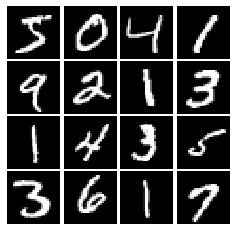

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], -1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, activation=leaky_relu, input_dim=784),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, activation=tf.nn.relu, input_dim=noise_dim),
        tf.keras.layers.Dense(1024, activation=tf.nn.relu),
        tf.keras.layers.Dense(784, activation=tf.nn.tanh)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)

    Dx = cross_entropy(tf.ones(logits_real.get_shape()), logits_real)
    DGx = cross_entropy(tf.zeros(logits_fake.get_shape()), logits_fake)
    loss = Dx + DGx

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)
    
    loss = cross_entropy(tf.ones(logits_fake.get_shape()), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 2.138, G:0.7132
Instructions for updating:
Use tf.identity instead.


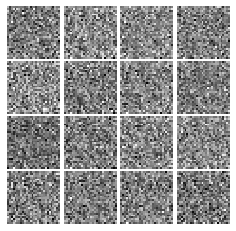

Epoch: 0, Iter: 20, D: 0.5756, G:1.003


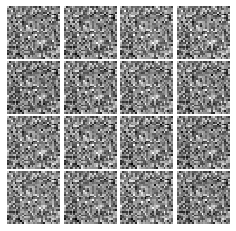

Epoch: 0, Iter: 40, D: 0.7071, G:1.023


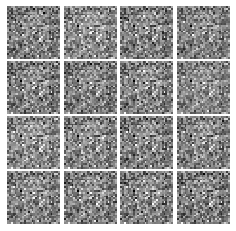

Epoch: 0, Iter: 60, D: 1.474, G:0.7009


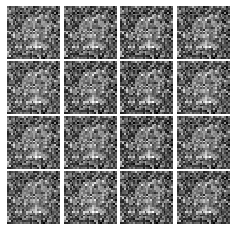

Epoch: 0, Iter: 80, D: 1.345, G:1.61


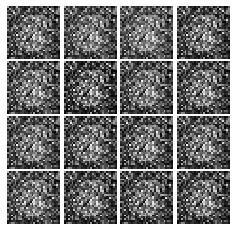

Epoch: 0, Iter: 100, D: 1.441, G:0.8718


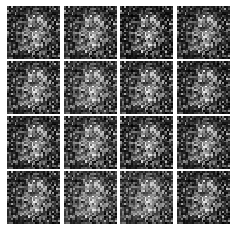

Epoch: 0, Iter: 120, D: 0.8905, G:1.153


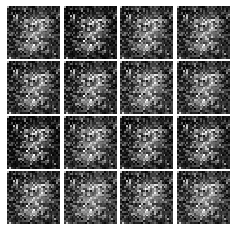

Epoch: 0, Iter: 140, D: 0.9612, G:2.109


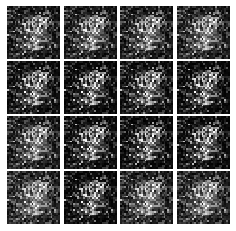

Epoch: 0, Iter: 160, D: 1.151, G:1.472


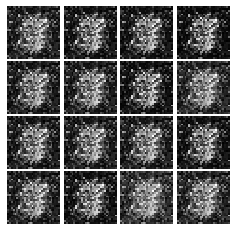

Epoch: 0, Iter: 180, D: 1.826, G:1.193


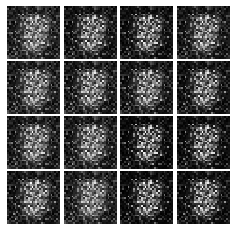

Epoch: 0, Iter: 200, D: 1.723, G:1.188


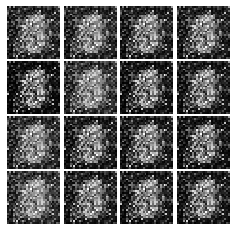

Epoch: 0, Iter: 220, D: 1.302, G:1.185


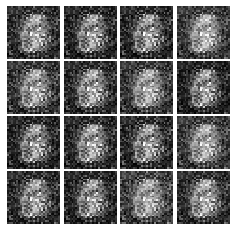

Epoch: 0, Iter: 240, D: 0.9476, G:1.721


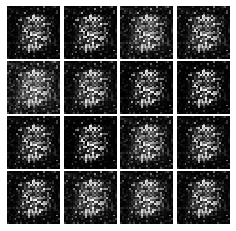

Epoch: 0, Iter: 260, D: 1.038, G:0.9577


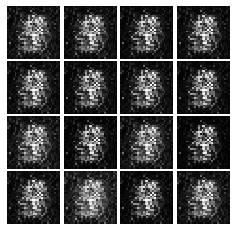

Epoch: 0, Iter: 280, D: 1.331, G:1.538


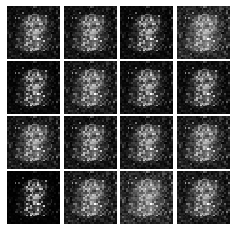

Epoch: 0, Iter: 300, D: 1.388, G:1.132


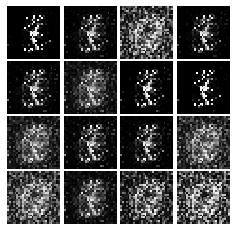

Epoch: 0, Iter: 320, D: 1.206, G:0.8063


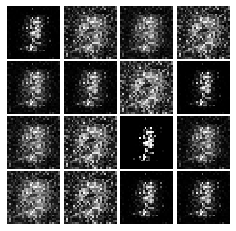

Epoch: 0, Iter: 340, D: 1.078, G:2.157


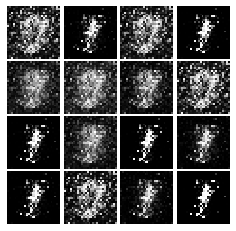

Epoch: 0, Iter: 360, D: 0.9801, G:1.854


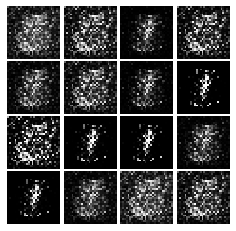

Epoch: 0, Iter: 380, D: 0.8692, G:1.935


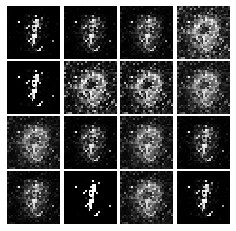

Epoch: 0, Iter: 400, D: 1.037, G:3.41


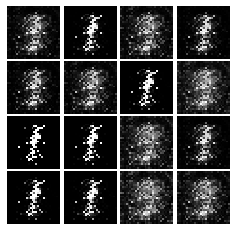

Epoch: 0, Iter: 420, D: 1.102, G:1.62


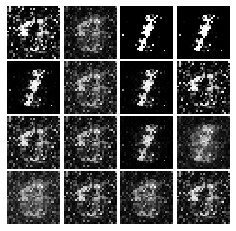

Epoch: 0, Iter: 440, D: 1.02, G:1.51


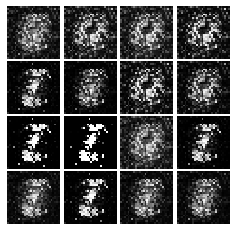

Epoch: 0, Iter: 460, D: 0.8302, G:1.617


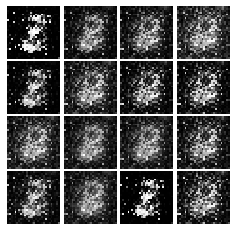

Epoch: 1, Iter: 480, D: 0.8644, G:1.534


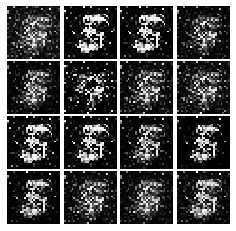

Epoch: 1, Iter: 500, D: 1.245, G:0.806


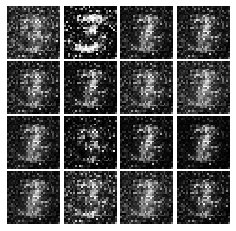

Epoch: 1, Iter: 520, D: 0.8349, G:1.778


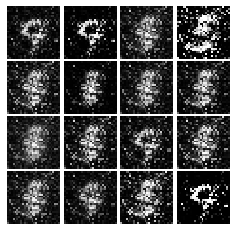

Epoch: 1, Iter: 540, D: 2.47, G:1.074


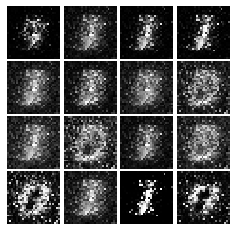

Epoch: 1, Iter: 560, D: 1.096, G:0.9973


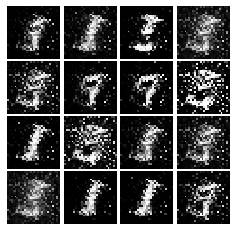

Epoch: 1, Iter: 580, D: 1.106, G:1.357


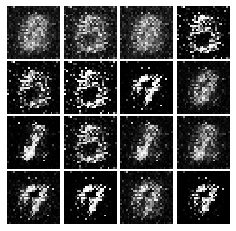

Epoch: 1, Iter: 600, D: 0.8757, G:1.924


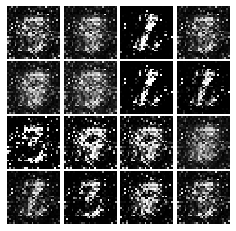

Epoch: 1, Iter: 620, D: 1.384, G:0.8977


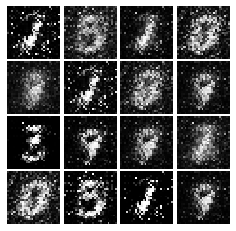

Epoch: 1, Iter: 640, D: 0.7574, G:1.548


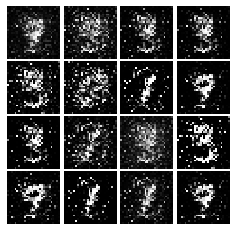

Epoch: 1, Iter: 660, D: 1.489, G:2.79


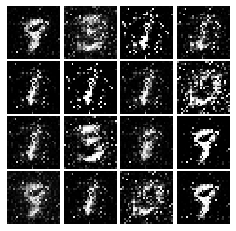

Epoch: 1, Iter: 680, D: 0.8447, G:1.637


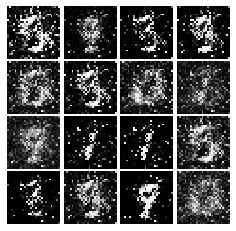

Epoch: 1, Iter: 700, D: 1.015, G:1.653


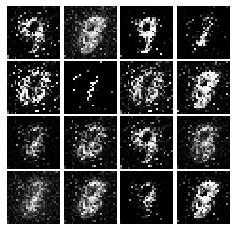

Epoch: 1, Iter: 720, D: 1.095, G:0.768


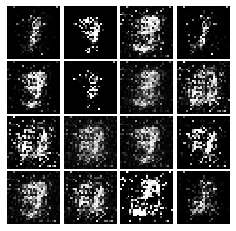

Epoch: 1, Iter: 740, D: 1.073, G:1.566


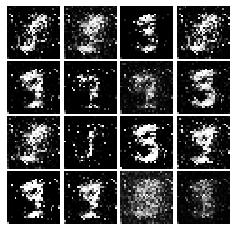

Epoch: 1, Iter: 760, D: 0.8879, G:1.439


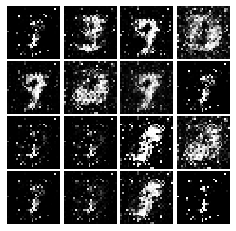

Epoch: 1, Iter: 780, D: 1.058, G:1.942


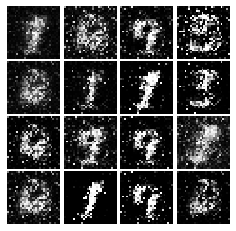

Epoch: 1, Iter: 800, D: 1.073, G:1.423


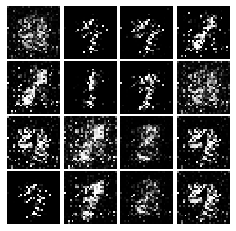

Epoch: 1, Iter: 820, D: 1.223, G:2.966


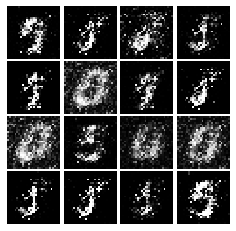

Epoch: 1, Iter: 840, D: 1.086, G:1.449


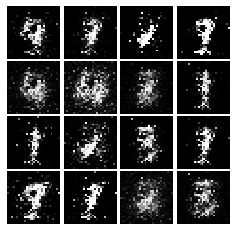

Epoch: 1, Iter: 860, D: 1.221, G:2.85


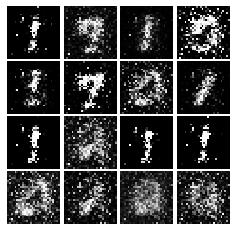

Epoch: 1, Iter: 880, D: 1.432, G:0.9587


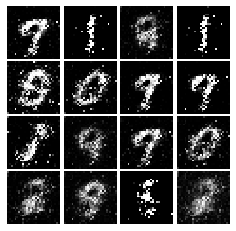

Epoch: 1, Iter: 900, D: 1.111, G:1.294


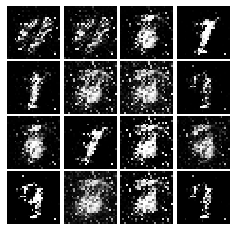

Epoch: 1, Iter: 920, D: 1.038, G:1.242


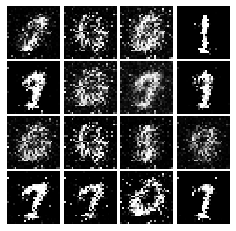

Epoch: 2, Iter: 940, D: 1.209, G:0.9392


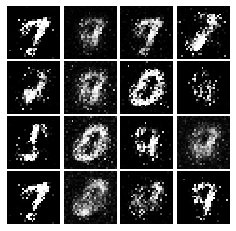

Epoch: 2, Iter: 960, D: 1.063, G:1.453


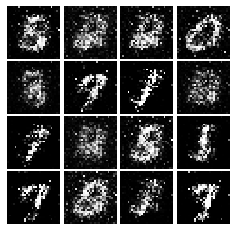

Epoch: 2, Iter: 980, D: 0.9281, G:1.405


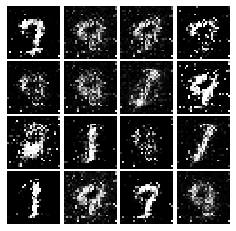

Epoch: 2, Iter: 1000, D: 1.178, G:1.181


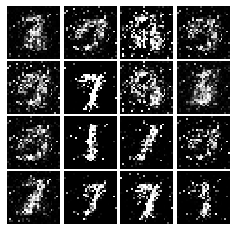

Epoch: 2, Iter: 1020, D: 0.9785, G:1.472


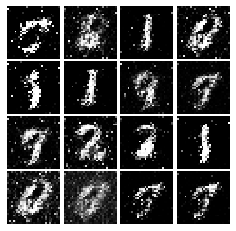

Epoch: 2, Iter: 1040, D: 0.9663, G:1.843


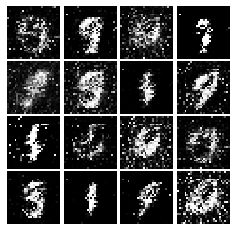

Epoch: 2, Iter: 1060, D: 1.444, G:0.4131


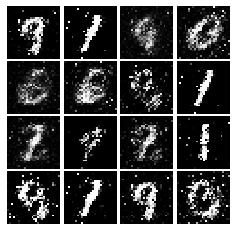

Epoch: 2, Iter: 1080, D: 1.155, G:1.414


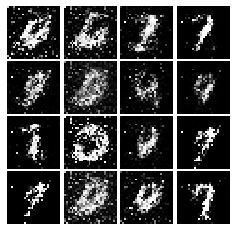

Epoch: 2, Iter: 1100, D: 1.166, G:1.085


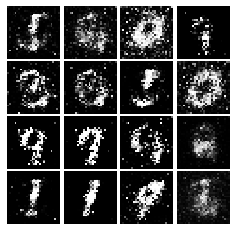

Epoch: 2, Iter: 1120, D: 1.221, G:1.012


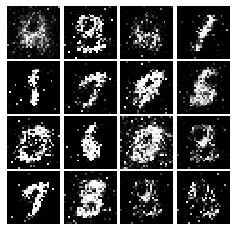

Epoch: 2, Iter: 1140, D: 1.368, G:1.198


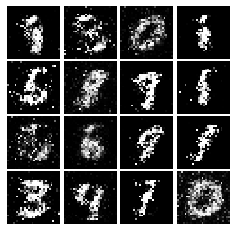

Epoch: 2, Iter: 1160, D: 1.209, G:0.7406


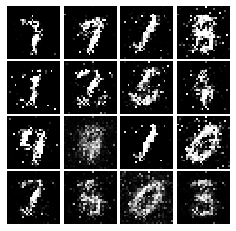

Epoch: 2, Iter: 1180, D: 1.206, G:0.945


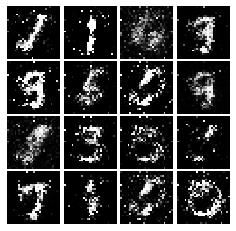

Epoch: 2, Iter: 1200, D: 1.259, G:0.9476


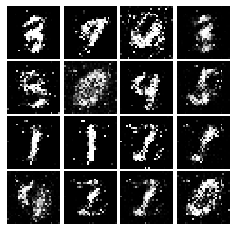

Epoch: 2, Iter: 1220, D: 1.179, G:0.9977


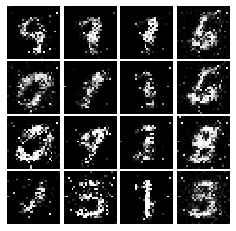

Epoch: 2, Iter: 1240, D: 1.672, G:1.796


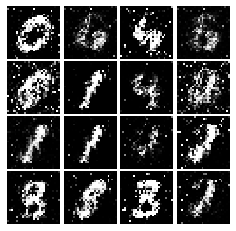

Epoch: 2, Iter: 1260, D: 1.229, G:0.9315


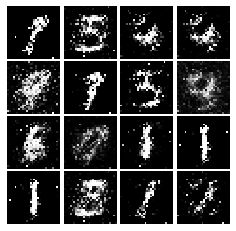

Epoch: 2, Iter: 1280, D: 1.131, G:1.058


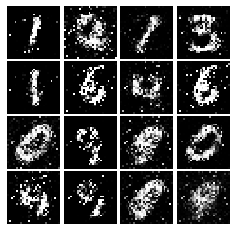

Epoch: 2, Iter: 1300, D: 1.456, G:0.8955


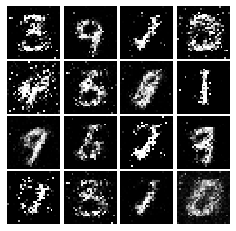

Epoch: 2, Iter: 1320, D: 1.364, G:1.735


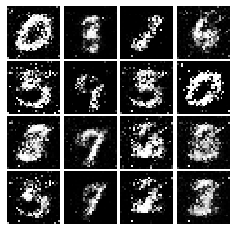

Epoch: 2, Iter: 1340, D: 1.289, G:0.8996


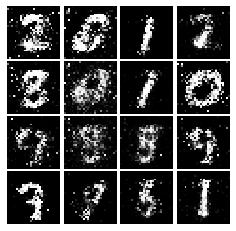

Epoch: 2, Iter: 1360, D: 1.192, G:0.9039


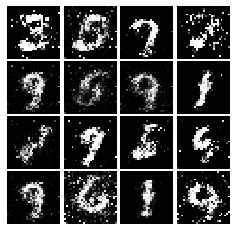

Epoch: 2, Iter: 1380, D: 1.244, G:0.8047


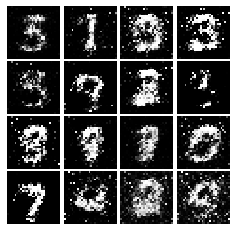

Epoch: 2, Iter: 1400, D: 1.143, G:0.9818


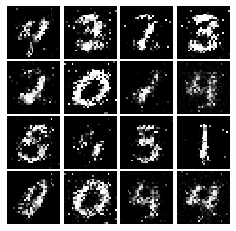

Epoch: 3, Iter: 1420, D: 1.352, G:0.9822


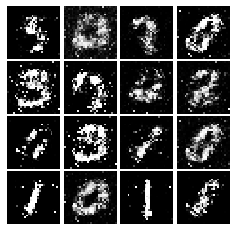

Epoch: 3, Iter: 1440, D: 1.208, G:0.9174


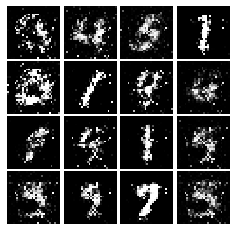

Epoch: 3, Iter: 1460, D: 1.235, G:0.9152


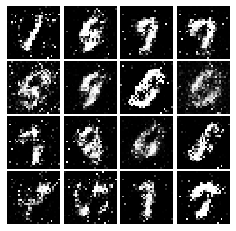

Epoch: 3, Iter: 1480, D: 1.209, G:1.139


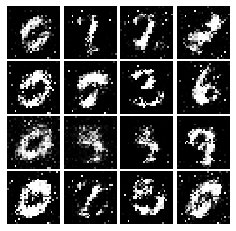

Epoch: 3, Iter: 1500, D: 1.366, G:0.8698


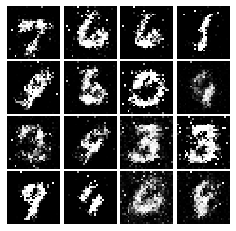

Epoch: 3, Iter: 1520, D: 1.317, G:0.9346


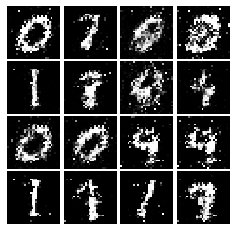

Epoch: 3, Iter: 1540, D: 1.338, G:0.968


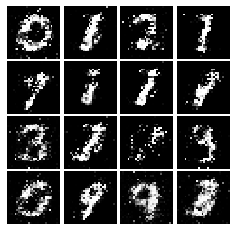

Epoch: 3, Iter: 1560, D: 1.219, G:0.9467


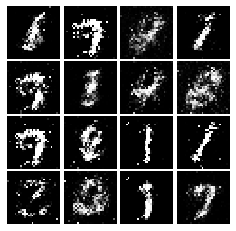

Epoch: 3, Iter: 1580, D: 1.261, G:1.013


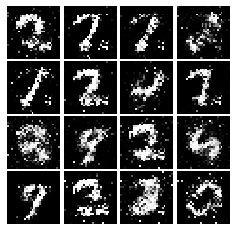

Epoch: 3, Iter: 1600, D: 1.218, G:1.017


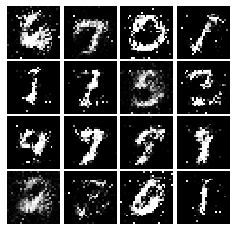

Epoch: 3, Iter: 1620, D: 1.217, G:0.9139


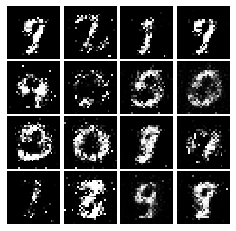

Epoch: 3, Iter: 1640, D: 1.391, G:0.8992


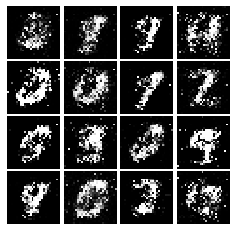

Epoch: 3, Iter: 1660, D: 1.134, G:1.105


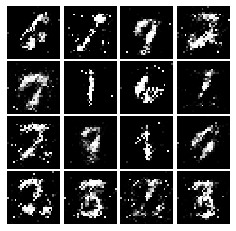

Epoch: 3, Iter: 1680, D: 1.283, G:0.8601


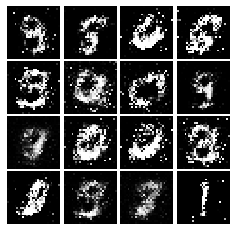

Epoch: 3, Iter: 1700, D: 1.41, G:0.8118


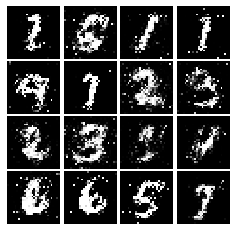

Epoch: 3, Iter: 1720, D: 1.31, G:0.8354


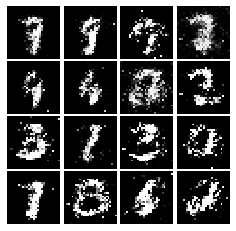

Epoch: 3, Iter: 1740, D: 1.358, G:0.9591


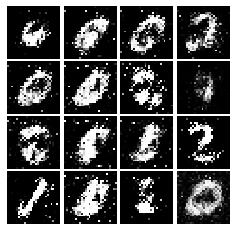

Epoch: 3, Iter: 1760, D: 1.021, G:1.226


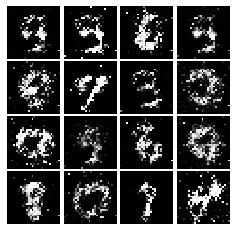

Epoch: 3, Iter: 1780, D: 1.169, G:2.019


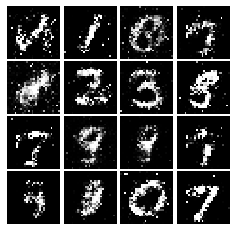

Epoch: 3, Iter: 1800, D: 1.271, G:1.126


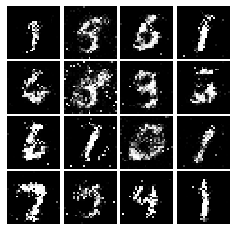

Epoch: 3, Iter: 1820, D: 1.189, G:0.9814


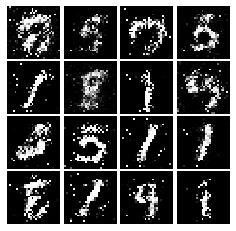

Epoch: 3, Iter: 1840, D: 1.318, G:0.9199


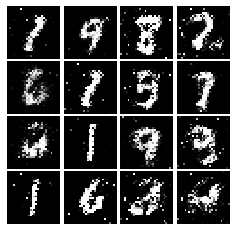

Epoch: 3, Iter: 1860, D: 1.237, G:0.991


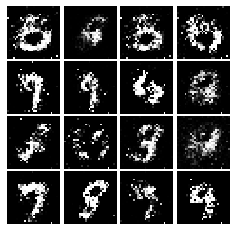

Epoch: 4, Iter: 1880, D: 1.184, G:0.9179


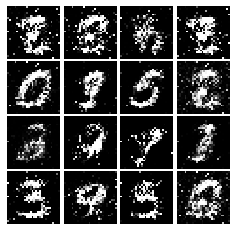

Epoch: 4, Iter: 1900, D: 1.309, G:1.005


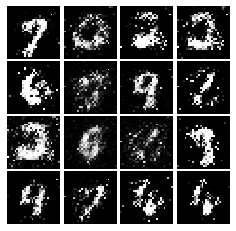

Epoch: 4, Iter: 1920, D: 1.214, G:0.8483


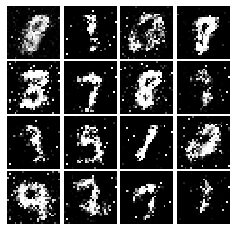

Epoch: 4, Iter: 1940, D: 1.167, G:1.206


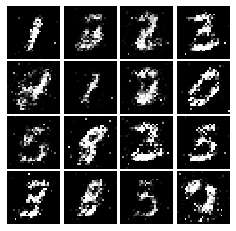

Epoch: 4, Iter: 1960, D: 1.211, G:0.9308


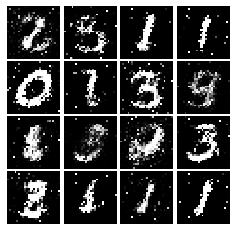

Epoch: 4, Iter: 1980, D: 1.233, G:0.9134


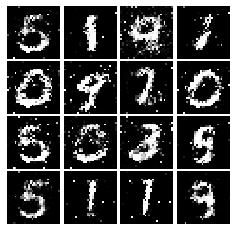

Epoch: 4, Iter: 2000, D: 1.345, G:0.7538


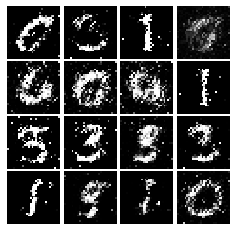

Epoch: 4, Iter: 2020, D: 1.268, G:0.8139


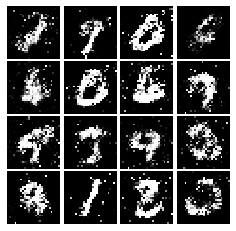

Epoch: 4, Iter: 2040, D: 1.312, G:0.9037


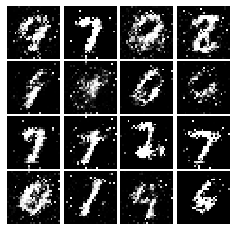

Epoch: 4, Iter: 2060, D: 1.448, G:1.39


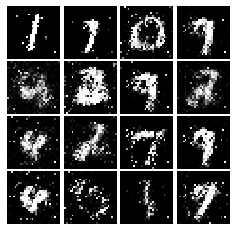

Epoch: 4, Iter: 2080, D: 1.318, G:0.8042


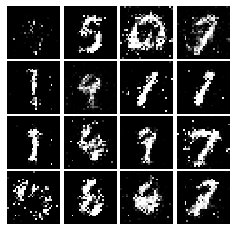

Epoch: 4, Iter: 2100, D: 1.384, G:1.013


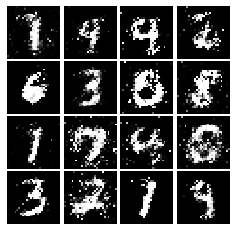

Epoch: 4, Iter: 2120, D: 1.325, G:0.8641


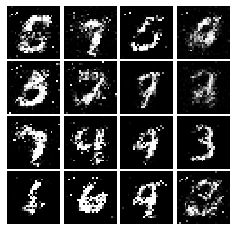

Epoch: 4, Iter: 2140, D: 1.275, G:0.8333


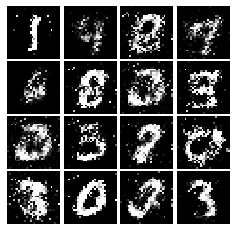

Epoch: 4, Iter: 2160, D: 1.474, G:0.8923


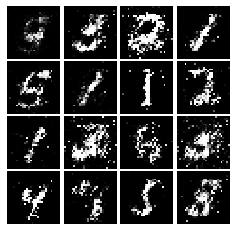

Epoch: 4, Iter: 2180, D: 1.323, G:0.8222


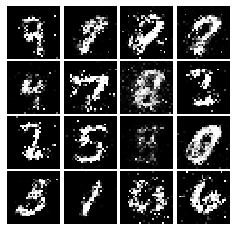

Epoch: 4, Iter: 2200, D: 1.326, G:0.8389


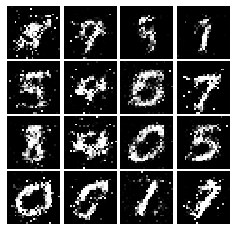

Epoch: 4, Iter: 2220, D: 1.237, G:0.9294


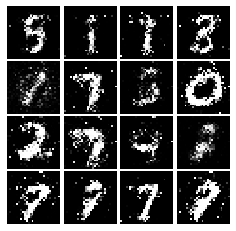

Epoch: 4, Iter: 2240, D: 1.236, G:0.7952


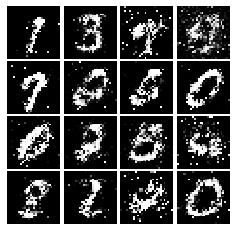

Epoch: 4, Iter: 2260, D: 1.236, G:0.8054


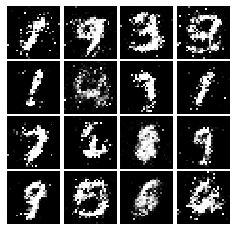

Epoch: 4, Iter: 2280, D: 1.219, G:0.9892


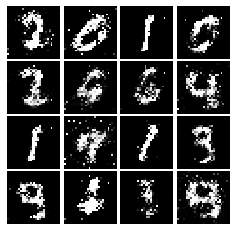

Epoch: 4, Iter: 2300, D: 1.308, G:0.8955


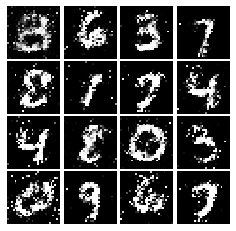

Epoch: 4, Iter: 2320, D: 1.294, G:0.8485


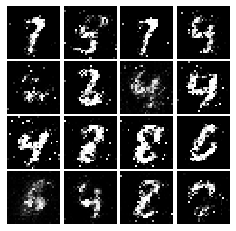

Epoch: 4, Iter: 2340, D: 1.158, G:1.132


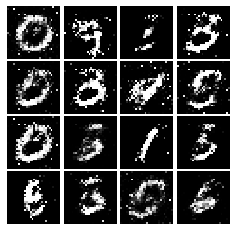

Epoch: 5, Iter: 2360, D: 1.255, G:0.9984


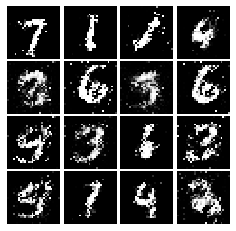

Epoch: 5, Iter: 2380, D: 1.233, G:0.8924


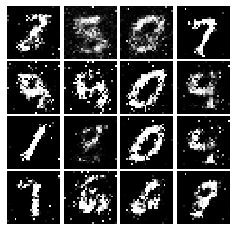

Epoch: 5, Iter: 2400, D: 1.276, G:0.8637


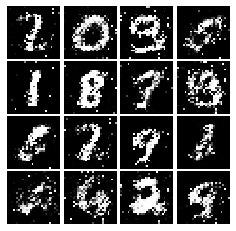

Epoch: 5, Iter: 2420, D: 1.309, G:0.845


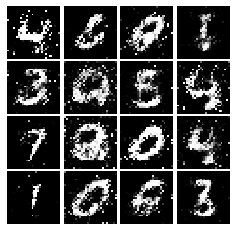

Epoch: 5, Iter: 2440, D: 1.283, G:0.8462


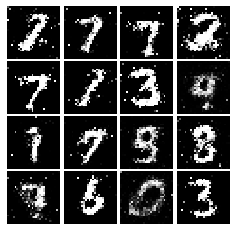

Epoch: 5, Iter: 2460, D: 1.154, G:0.8859


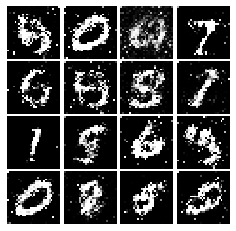

Epoch: 5, Iter: 2480, D: 1.251, G:0.8661


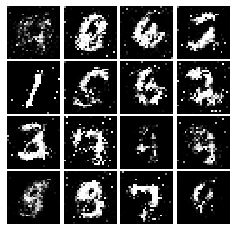

Epoch: 5, Iter: 2500, D: 1.285, G:1.323


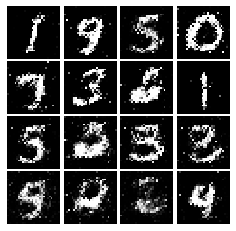

Epoch: 5, Iter: 2520, D: 1.383, G:0.8091


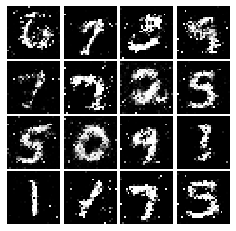

Epoch: 5, Iter: 2540, D: 1.344, G:0.8231


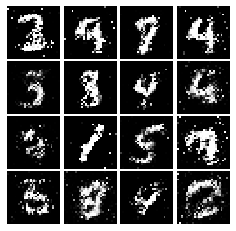

Epoch: 5, Iter: 2560, D: 1.352, G:0.8251


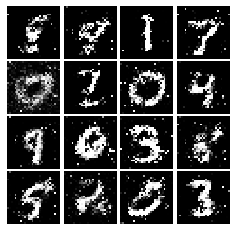

Epoch: 5, Iter: 2580, D: 1.323, G:0.8525


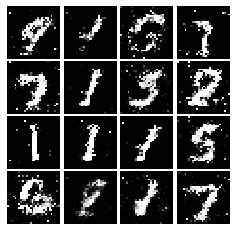

Epoch: 5, Iter: 2600, D: 1.512, G:0.7837


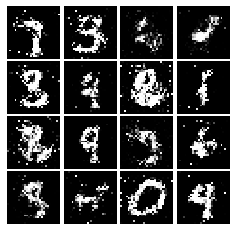

Epoch: 5, Iter: 2620, D: 1.294, G:0.7696


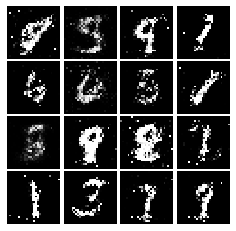

Epoch: 5, Iter: 2640, D: 1.381, G:0.8


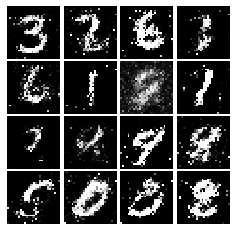

Epoch: 5, Iter: 2660, D: 1.171, G:0.8833


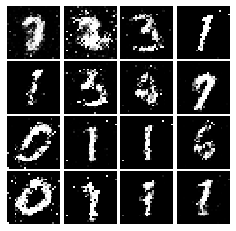

Epoch: 5, Iter: 2680, D: 1.356, G:0.906


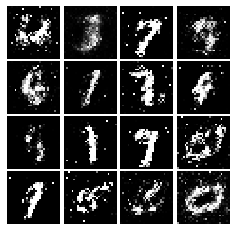

Epoch: 5, Iter: 2700, D: 1.231, G:0.8336


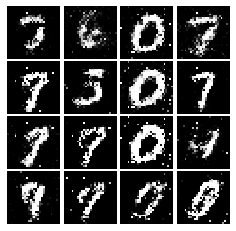

Epoch: 5, Iter: 2720, D: 1.28, G:0.84


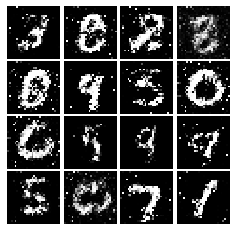

Epoch: 5, Iter: 2740, D: 1.174, G:0.9638


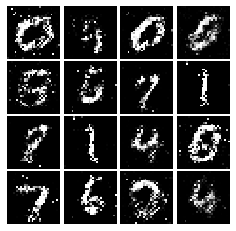

Epoch: 5, Iter: 2760, D: 1.234, G:0.9649


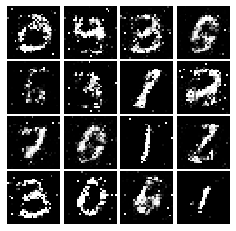

Epoch: 5, Iter: 2780, D: 1.275, G:0.8166


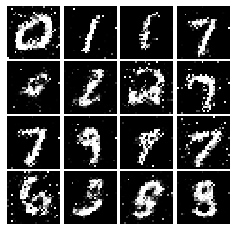

Epoch: 5, Iter: 2800, D: 1.356, G:0.8627


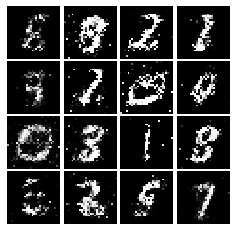

Epoch: 6, Iter: 2820, D: 1.359, G:1.05


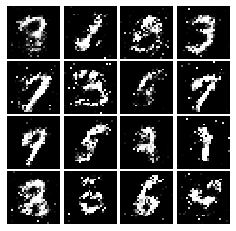

Epoch: 6, Iter: 2840, D: 1.314, G:1.013


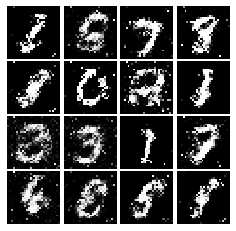

Epoch: 6, Iter: 2860, D: 1.386, G:0.8974


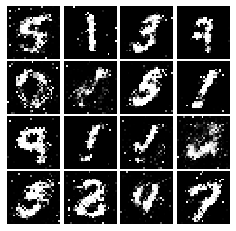

Epoch: 6, Iter: 2880, D: 1.188, G:1.083


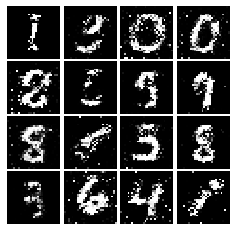

Epoch: 6, Iter: 2900, D: 1.3, G:0.9308


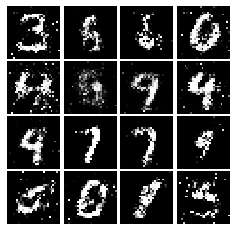

Epoch: 6, Iter: 2920, D: 1.376, G:0.9551


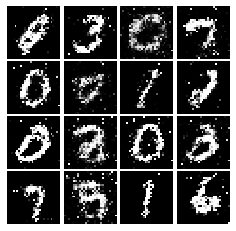

Epoch: 6, Iter: 2940, D: 1.412, G:0.8883


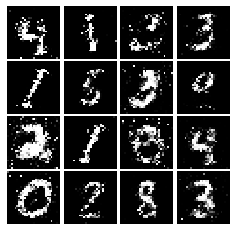

Epoch: 6, Iter: 2960, D: 1.252, G:0.7879


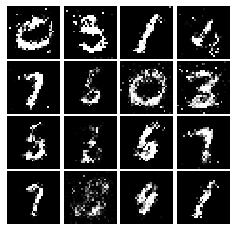

Epoch: 6, Iter: 2980, D: 1.325, G:0.869


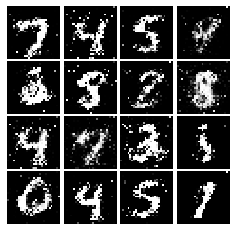

Epoch: 6, Iter: 3000, D: 1.431, G:0.8776


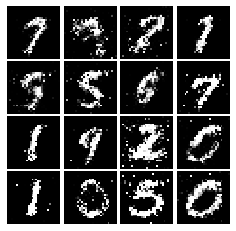

Epoch: 6, Iter: 3020, D: 1.284, G:0.7918


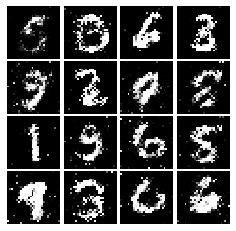

Epoch: 6, Iter: 3040, D: 1.361, G:0.8362


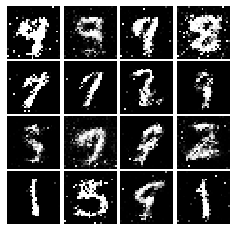

Epoch: 6, Iter: 3060, D: 1.35, G:0.7946


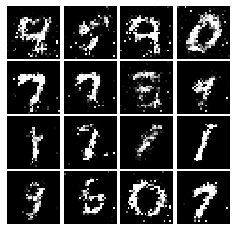

Epoch: 6, Iter: 3080, D: 1.345, G:0.7842


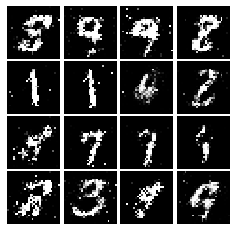

Epoch: 6, Iter: 3100, D: 1.275, G:0.9665


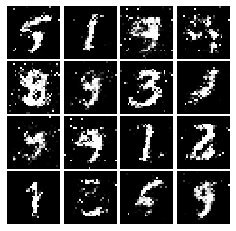

Epoch: 6, Iter: 3120, D: 1.285, G:0.8827


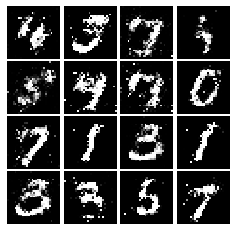

Epoch: 6, Iter: 3140, D: 1.286, G:0.7754


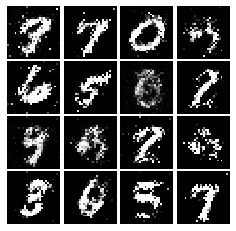

Epoch: 6, Iter: 3160, D: 1.249, G:0.8731


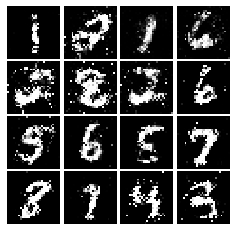

Epoch: 6, Iter: 3180, D: 1.232, G:0.9036


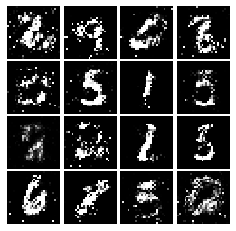

Epoch: 6, Iter: 3200, D: 1.3, G:0.8354


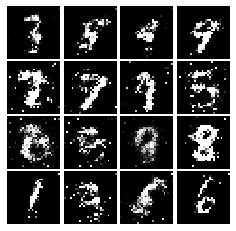

Epoch: 6, Iter: 3220, D: 1.32, G:0.8633


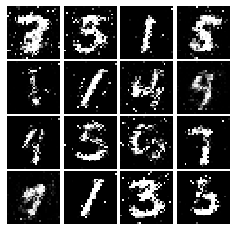

Epoch: 6, Iter: 3240, D: 1.246, G:0.8287


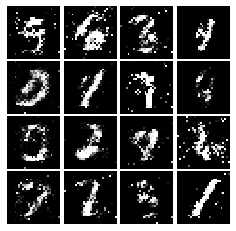

Epoch: 6, Iter: 3260, D: 1.418, G:0.7603


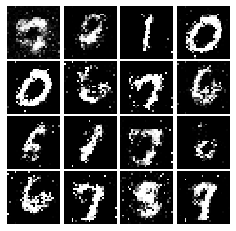

Epoch: 6, Iter: 3280, D: 1.214, G:0.9926


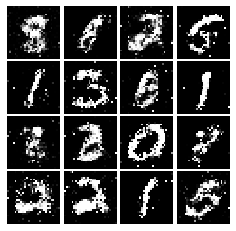

Epoch: 7, Iter: 3300, D: 1.231, G:0.7838


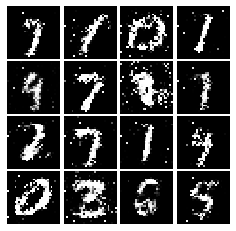

Epoch: 7, Iter: 3320, D: 1.29, G:0.8689


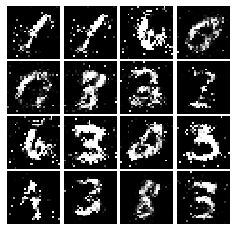

Epoch: 7, Iter: 3340, D: 1.255, G:0.8453


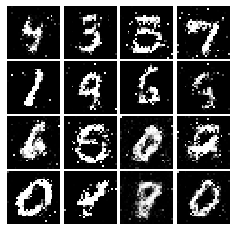

Epoch: 7, Iter: 3360, D: 1.383, G:0.8674


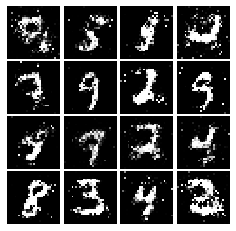

Epoch: 7, Iter: 3380, D: 1.305, G:0.811


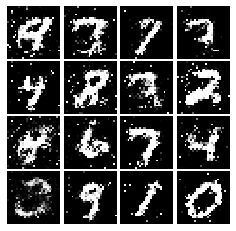

Epoch: 7, Iter: 3400, D: 1.45, G:0.8852


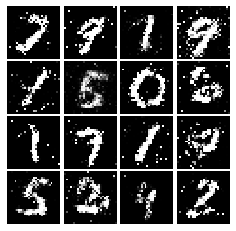

Epoch: 7, Iter: 3420, D: 1.315, G:0.9542


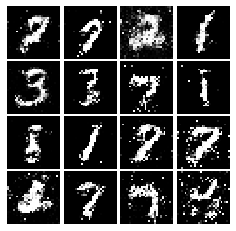

Epoch: 7, Iter: 3440, D: 1.283, G:0.8495


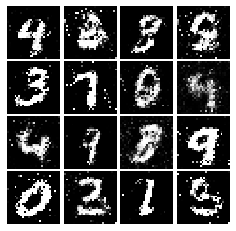

Epoch: 7, Iter: 3460, D: 1.272, G:0.8588


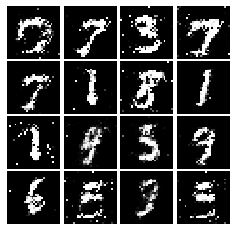

Epoch: 7, Iter: 3480, D: 1.311, G:0.7803


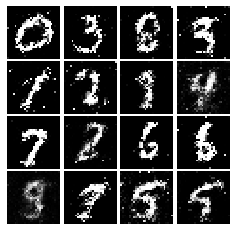

Epoch: 7, Iter: 3500, D: 1.38, G:0.8239


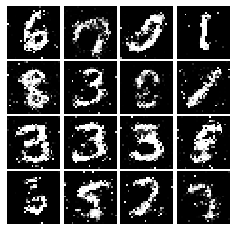

Epoch: 7, Iter: 3520, D: 1.393, G:0.7617


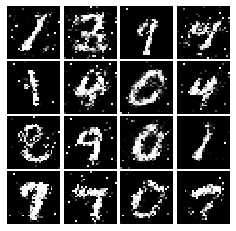

Epoch: 7, Iter: 3540, D: 1.249, G:0.8304


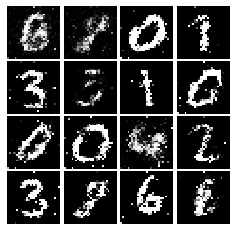

Epoch: 7, Iter: 3560, D: 1.308, G:0.8287


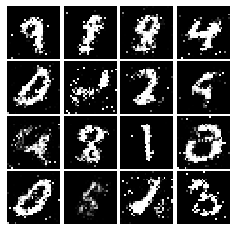

Epoch: 7, Iter: 3580, D: 1.297, G:0.8494


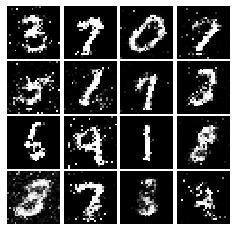

Epoch: 7, Iter: 3600, D: 1.286, G:0.9638


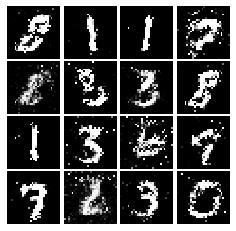

Epoch: 7, Iter: 3620, D: 1.282, G:0.8537


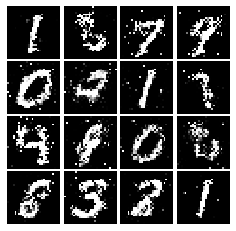

Epoch: 7, Iter: 3640, D: 1.425, G:0.8229


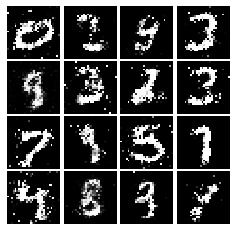

Epoch: 7, Iter: 3660, D: 1.314, G:0.832


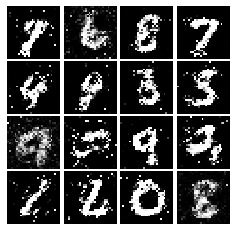

Epoch: 7, Iter: 3680, D: 1.309, G:0.8303


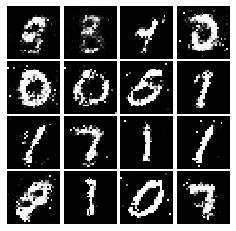

Epoch: 7, Iter: 3700, D: 1.298, G:0.8152


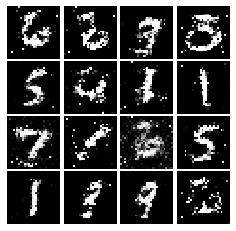

Epoch: 7, Iter: 3720, D: 1.375, G:0.8097


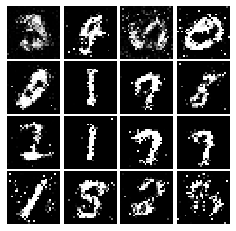

Epoch: 7, Iter: 3740, D: 1.377, G:0.8435


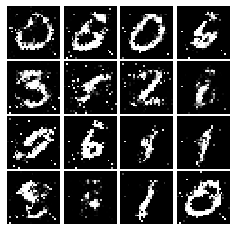

Epoch: 8, Iter: 3760, D: 1.354, G:0.8652


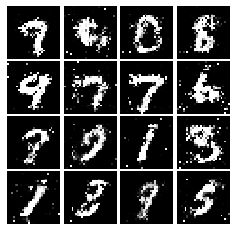

Epoch: 8, Iter: 3780, D: 1.414, G:0.782


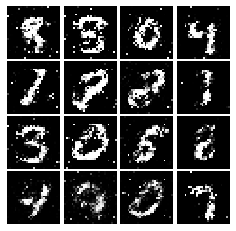

Epoch: 8, Iter: 3800, D: 1.388, G:0.8241


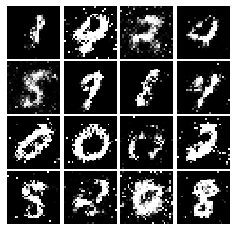

Epoch: 8, Iter: 3820, D: 1.359, G:0.7995


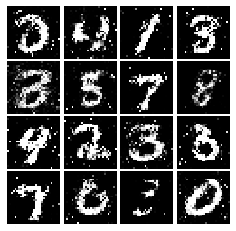

Epoch: 8, Iter: 3840, D: 1.392, G:0.8766


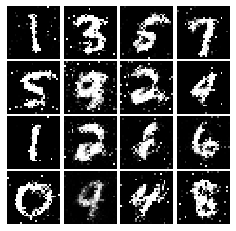

Epoch: 8, Iter: 3860, D: 1.244, G:0.9286


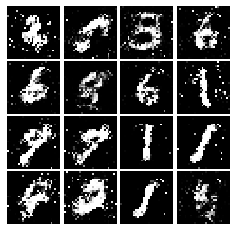

Epoch: 8, Iter: 3880, D: 1.413, G:0.908


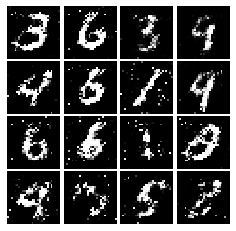

Epoch: 8, Iter: 3900, D: 1.364, G:0.8385


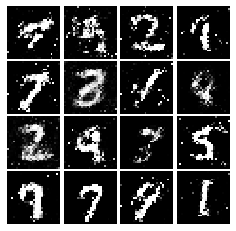

Epoch: 8, Iter: 3920, D: 1.304, G:0.7696


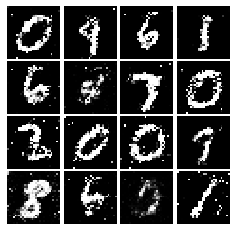

Epoch: 8, Iter: 3940, D: 1.327, G:0.7323


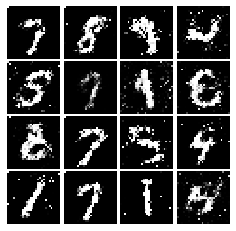

Epoch: 8, Iter: 3960, D: 1.356, G:0.87


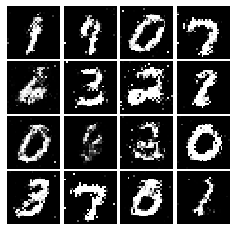

Epoch: 8, Iter: 3980, D: 1.395, G:0.8124


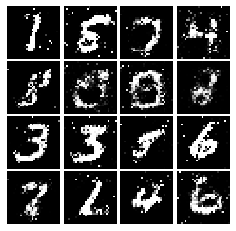

Epoch: 8, Iter: 4000, D: 1.346, G:0.7557


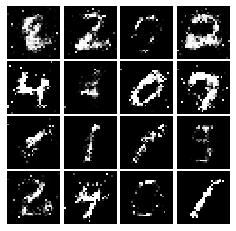

Epoch: 8, Iter: 4020, D: 1.368, G:0.8133


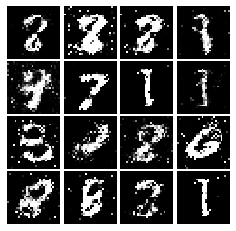

Epoch: 8, Iter: 4040, D: 1.27, G:0.8291


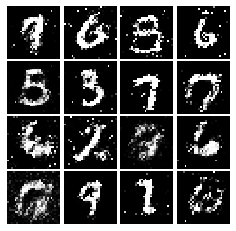

Epoch: 8, Iter: 4060, D: 1.301, G:0.8813


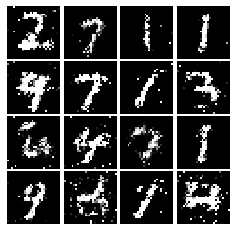

Epoch: 8, Iter: 4080, D: 1.294, G:0.8762


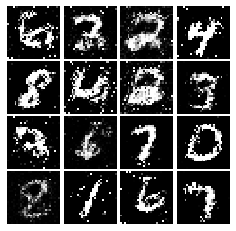

Epoch: 8, Iter: 4100, D: 1.423, G:0.8681


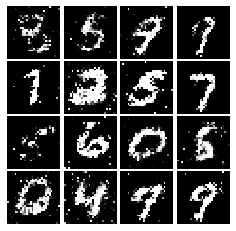

Epoch: 8, Iter: 4120, D: 1.329, G:0.7823


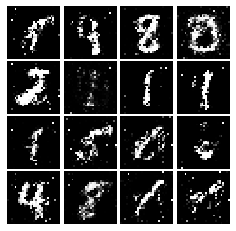

Epoch: 8, Iter: 4140, D: 1.369, G:0.7539


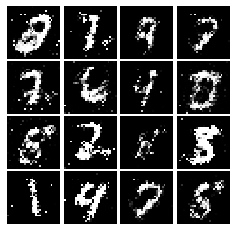

Epoch: 8, Iter: 4160, D: 1.414, G:0.82


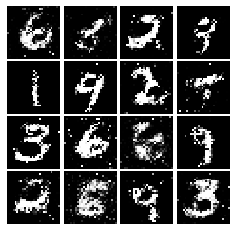

Epoch: 8, Iter: 4180, D: 1.327, G:0.7075


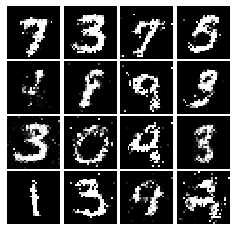

Epoch: 8, Iter: 4200, D: 1.334, G:0.8501


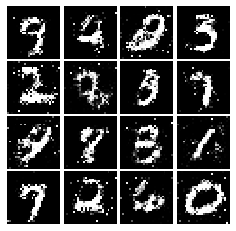

Epoch: 8, Iter: 4220, D: 1.501, G:0.8018


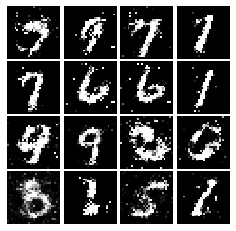

Epoch: 9, Iter: 4240, D: 1.38, G:0.8135


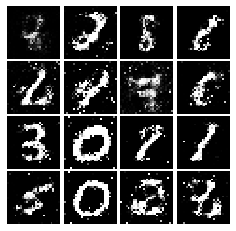

Epoch: 9, Iter: 4260, D: 1.429, G:0.767


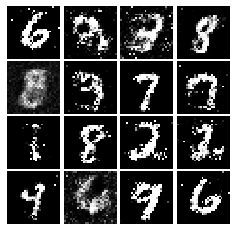

Epoch: 9, Iter: 4280, D: 1.504, G:0.7995


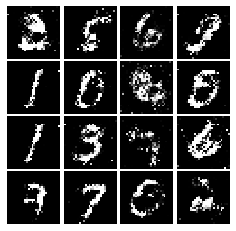

Epoch: 9, Iter: 4300, D: 1.313, G:0.8554


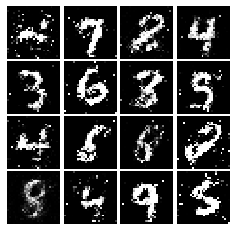

Epoch: 9, Iter: 4320, D: 1.336, G:0.8062


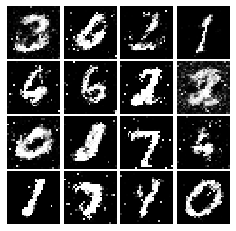

Epoch: 9, Iter: 4340, D: 1.388, G:0.7975


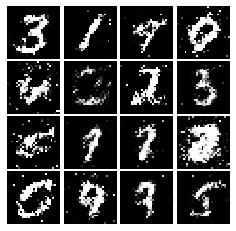

Epoch: 9, Iter: 4360, D: 1.4, G:0.8202


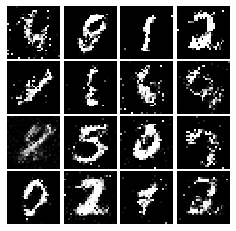

Epoch: 9, Iter: 4380, D: 1.305, G:0.8212


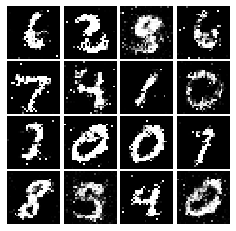

Epoch: 9, Iter: 4400, D: 1.265, G:0.9006


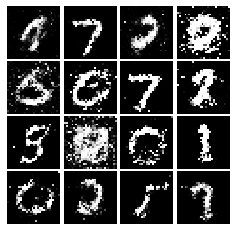

Epoch: 9, Iter: 4420, D: 1.336, G:0.8008


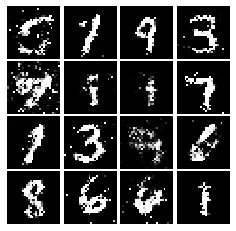

Epoch: 9, Iter: 4440, D: 1.273, G:0.9432


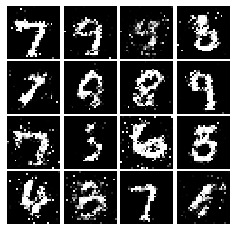

Epoch: 9, Iter: 4460, D: 1.464, G:0.7598


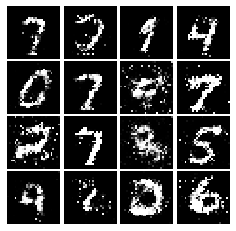

Epoch: 9, Iter: 4480, D: 1.268, G:0.8762


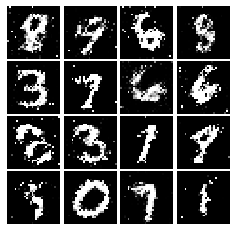

Epoch: 9, Iter: 4500, D: 1.374, G:0.818


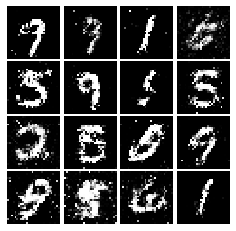

Epoch: 9, Iter: 4520, D: 1.302, G:0.869


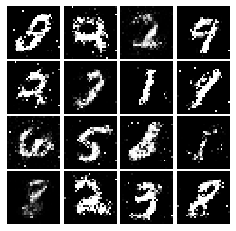

Epoch: 9, Iter: 4540, D: 1.33, G:0.8137


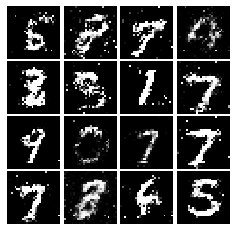

Epoch: 9, Iter: 4560, D: 1.325, G:0.7867


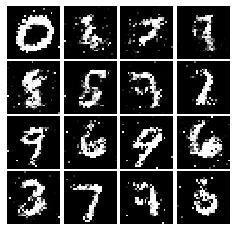

Epoch: 9, Iter: 4580, D: 1.258, G:0.7204


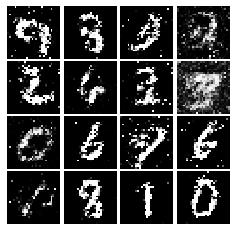

Epoch: 9, Iter: 4600, D: 1.335, G:0.8021


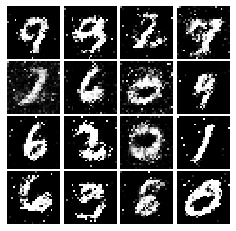

Epoch: 9, Iter: 4620, D: 1.376, G:0.6922


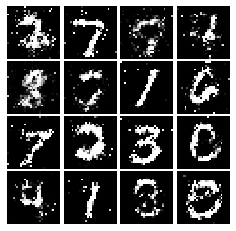

Epoch: 9, Iter: 4640, D: 1.315, G:0.8321


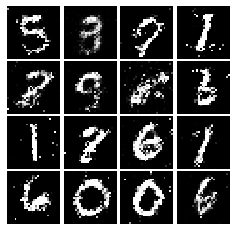

Epoch: 9, Iter: 4660, D: 1.349, G:0.8586


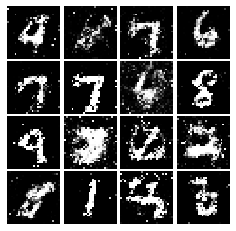

Epoch: 9, Iter: 4680, D: 1.315, G:0.7104


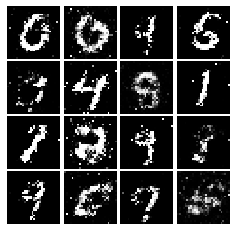

Final images


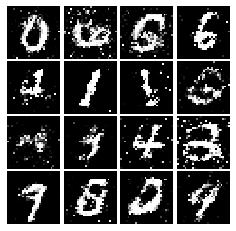

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_real - 1)**2) + 0.5 * tf.reduce_mean(scores_fake**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - 1)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.08826, G:0.6043


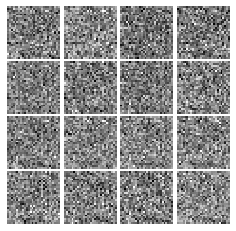

Epoch: 0, Iter: 20, D: 0.09892, G:0.7176


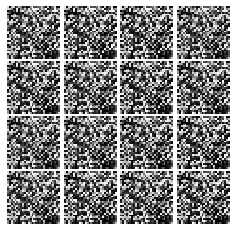

Epoch: 0, Iter: 40, D: 0.03435, G:0.9255


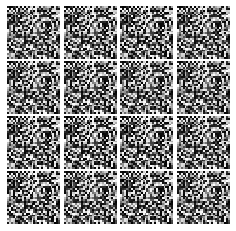

Epoch: 0, Iter: 60, D: 0.03141, G:0.6952


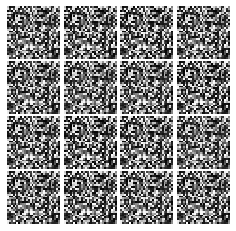

Epoch: 0, Iter: 80, D: 0.02932, G:0.4552


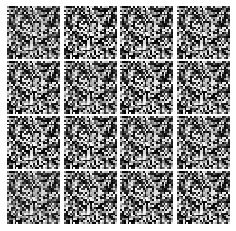

Epoch: 0, Iter: 100, D: 0.01247, G:0.6474


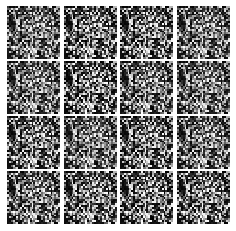

Epoch: 0, Iter: 120, D: 0.02733, G:0.4923


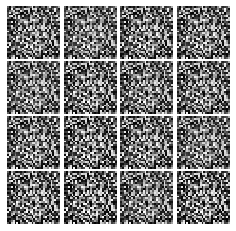

Epoch: 0, Iter: 140, D: 0.06686, G:0.7622


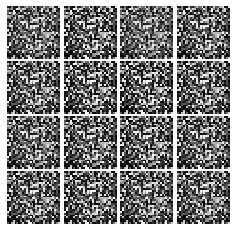

Epoch: 0, Iter: 160, D: 0.003401, G:0.5759


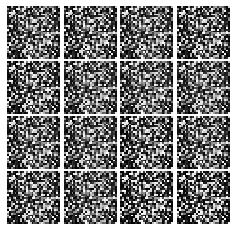

Epoch: 0, Iter: 180, D: 0.007555, G:0.543


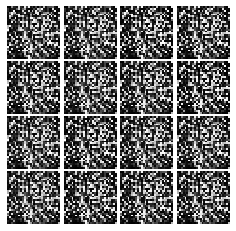

Epoch: 0, Iter: 200, D: 0.01362, G:0.5024


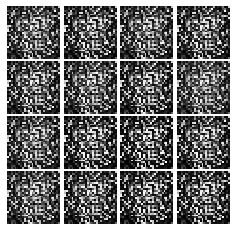

Epoch: 0, Iter: 220, D: 0.006607, G:0.5522


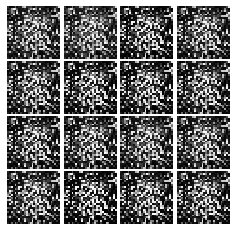

Epoch: 0, Iter: 240, D: 0.06655, G:0.8009


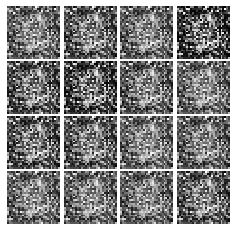

Epoch: 0, Iter: 260, D: 0.07359, G:0.5431


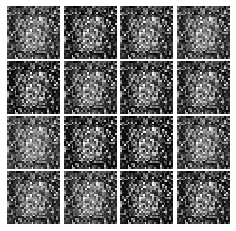

Epoch: 0, Iter: 280, D: 0.1003, G:0.5144


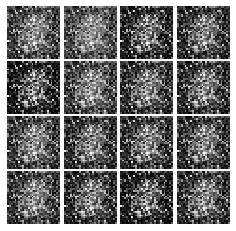

Epoch: 0, Iter: 300, D: 0.1667, G:0.6347


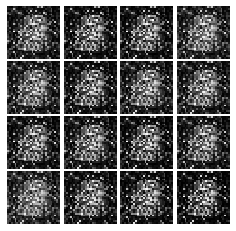

Epoch: 0, Iter: 320, D: 0.1615, G:0.249


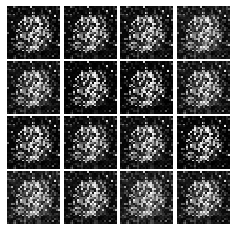

Epoch: 0, Iter: 340, D: 0.2873, G:0.04433


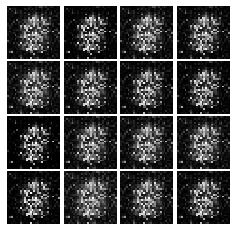

Epoch: 0, Iter: 360, D: 0.06835, G:0.4072


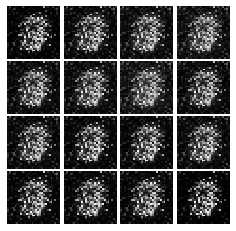

Epoch: 0, Iter: 380, D: 0.1217, G:0.3557


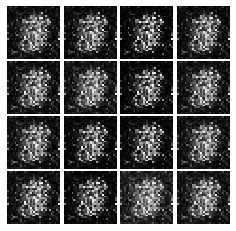

Epoch: 0, Iter: 400, D: 0.157, G:0.4561


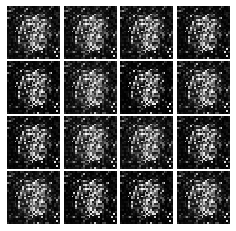

Epoch: 0, Iter: 420, D: 0.2407, G:0.3036


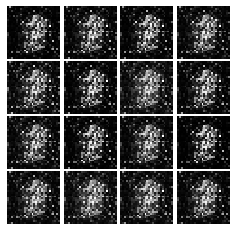

Epoch: 0, Iter: 440, D: 0.09715, G:0.4023


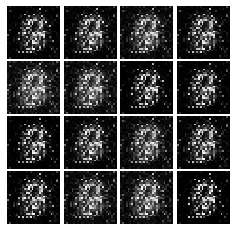

Epoch: 0, Iter: 460, D: 0.2009, G:0.3101


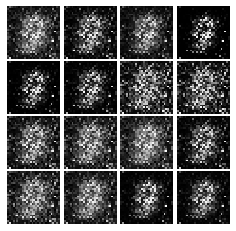

Epoch: 1, Iter: 480, D: 0.1748, G:0.2622


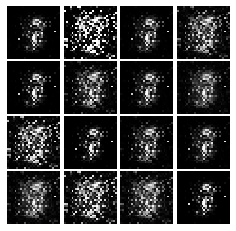

Epoch: 1, Iter: 500, D: 0.1227, G:0.2864


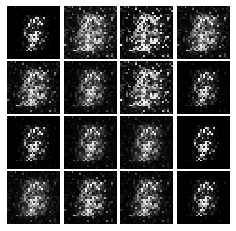

Epoch: 1, Iter: 520, D: 0.2172, G:0.2502


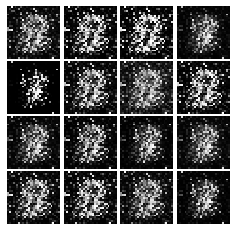

Epoch: 1, Iter: 540, D: 0.1128, G:0.4369


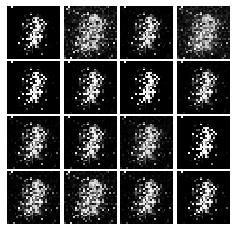

Epoch: 1, Iter: 560, D: 0.1083, G:0.4941


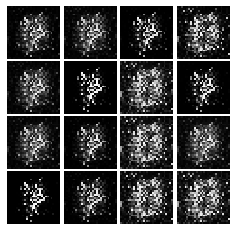

Epoch: 1, Iter: 580, D: 0.1785, G:0.4732


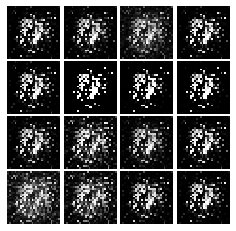

Epoch: 1, Iter: 600, D: 0.2317, G:0.2991


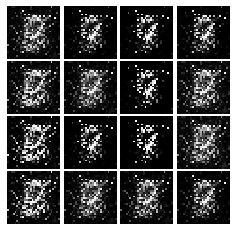

Epoch: 1, Iter: 620, D: 0.07217, G:0.4504


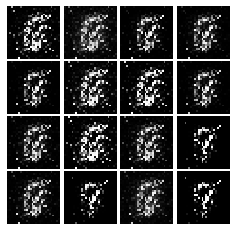

Epoch: 1, Iter: 640, D: 0.269, G:0.3585


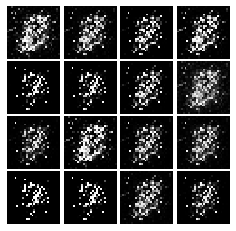

Epoch: 1, Iter: 660, D: 0.1026, G:0.4048


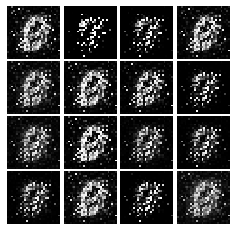

Epoch: 1, Iter: 680, D: 0.3804, G:0.5801


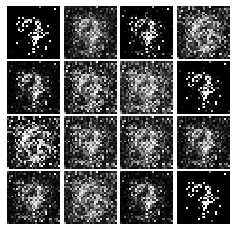

Epoch: 1, Iter: 700, D: 0.06083, G:0.498


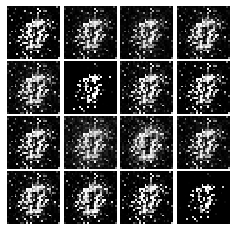

Epoch: 1, Iter: 720, D: 0.1574, G:0.4717


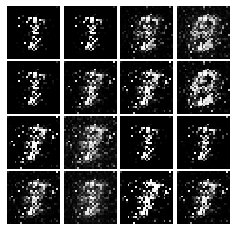

Epoch: 1, Iter: 740, D: 0.14, G:0.4048


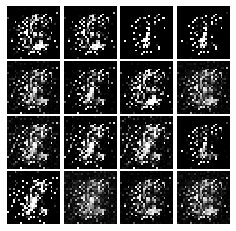

Epoch: 1, Iter: 760, D: 0.08827, G:0.3967


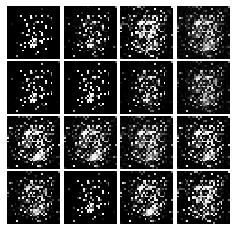

Epoch: 1, Iter: 780, D: 0.08359, G:0.5253


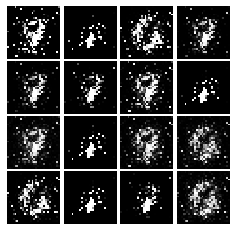

Epoch: 1, Iter: 800, D: 0.3762, G:0.5604


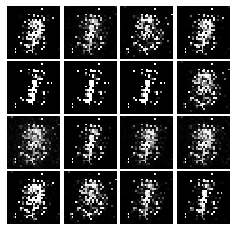

Epoch: 1, Iter: 820, D: 0.09589, G:0.597


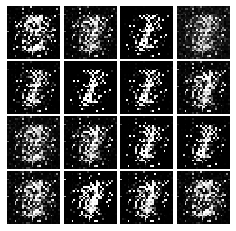

Epoch: 1, Iter: 840, D: 0.1621, G:0.3924


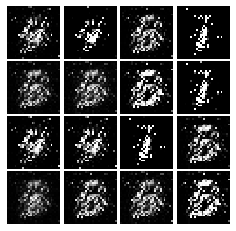

Epoch: 1, Iter: 860, D: 0.328, G:0.2084


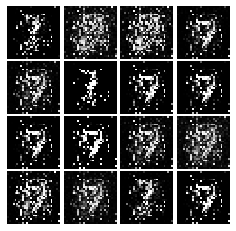

Epoch: 1, Iter: 880, D: 0.1495, G:0.6872


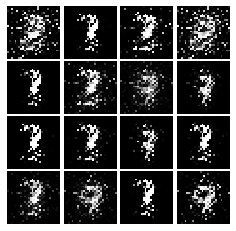

Epoch: 1, Iter: 900, D: 0.05765, G:0.4695


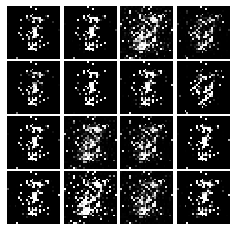

Epoch: 1, Iter: 920, D: 0.07708, G:0.7177


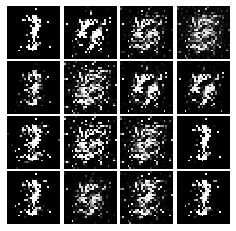

Epoch: 2, Iter: 940, D: 0.1302, G:0.3393


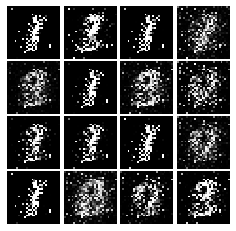

Epoch: 2, Iter: 960, D: 0.1435, G:0.3246


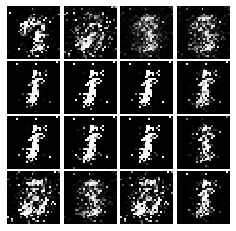

Epoch: 2, Iter: 980, D: 0.1385, G:0.365


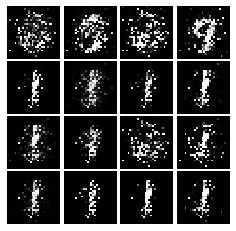

Epoch: 2, Iter: 1000, D: 0.3178, G:0.2625


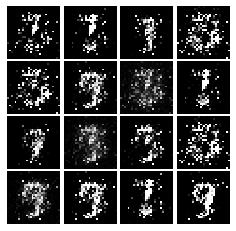

Epoch: 2, Iter: 1020, D: 0.1272, G:0.2927


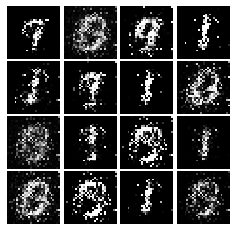

Epoch: 2, Iter: 1040, D: 0.1366, G:0.3023


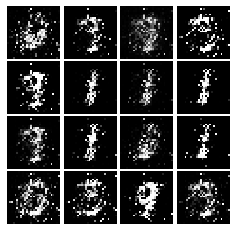

Epoch: 2, Iter: 1060, D: 0.2182, G:0.2001


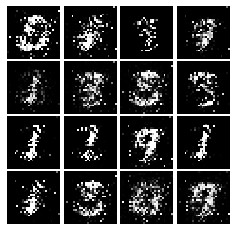

Epoch: 2, Iter: 1080, D: 0.2103, G:0.2954


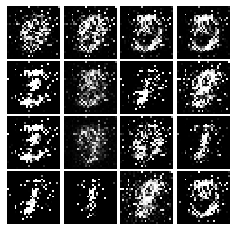

Epoch: 2, Iter: 1100, D: 0.1501, G:0.3498


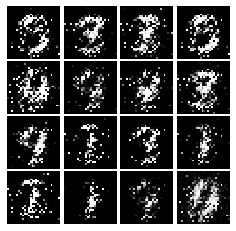

Epoch: 2, Iter: 1120, D: 0.1845, G:0.2583


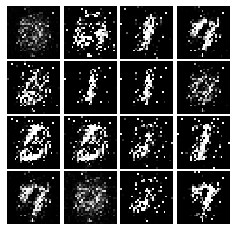

Epoch: 2, Iter: 1140, D: 0.2572, G:1.056


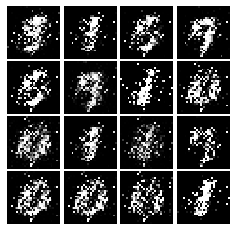

Epoch: 2, Iter: 1160, D: 0.1623, G:0.336


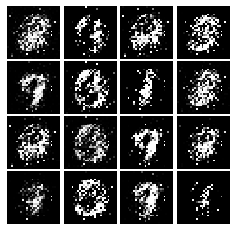

Epoch: 2, Iter: 1180, D: 0.1792, G:0.3911


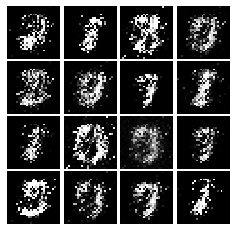

Epoch: 2, Iter: 1200, D: 0.1056, G:0.4176


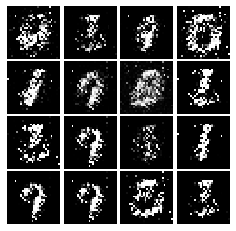

Epoch: 2, Iter: 1220, D: 0.1858, G:0.2583


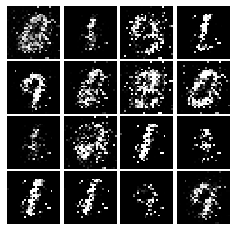

Epoch: 2, Iter: 1240, D: 0.1699, G:0.2733


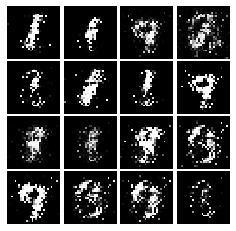

Epoch: 2, Iter: 1260, D: 0.1275, G:0.2914


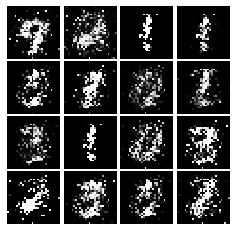

Epoch: 2, Iter: 1280, D: 0.2292, G:0.1722


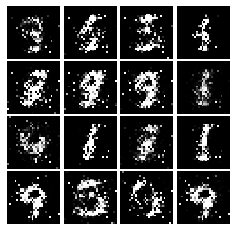

Epoch: 2, Iter: 1300, D: 0.1597, G:0.4669


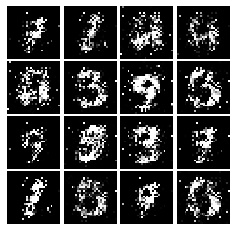

Epoch: 2, Iter: 1320, D: 0.1725, G:0.2425


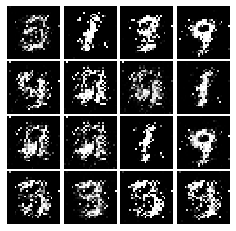

Epoch: 2, Iter: 1340, D: 0.184, G:0.4605


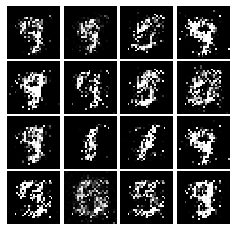

Epoch: 2, Iter: 1360, D: 0.1477, G:0.426


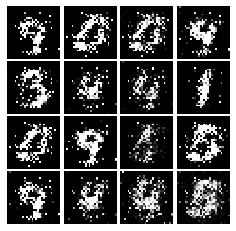

Epoch: 2, Iter: 1380, D: 0.2258, G:0.1319


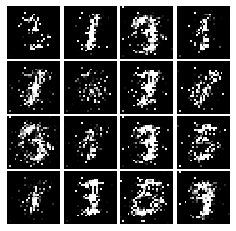

Epoch: 2, Iter: 1400, D: 0.1204, G:0.3206


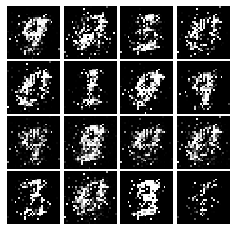

Epoch: 3, Iter: 1420, D: 0.2684, G:0.1998


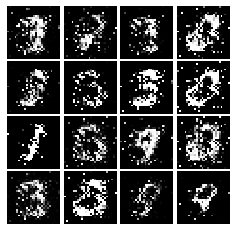

Epoch: 3, Iter: 1440, D: 0.1785, G:0.2446


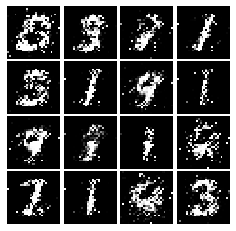

Epoch: 3, Iter: 1460, D: 0.1438, G:0.3067


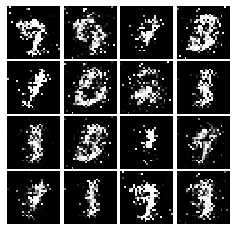

Epoch: 3, Iter: 1480, D: 0.162, G:0.2779


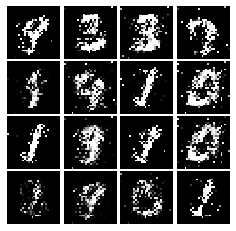

Epoch: 3, Iter: 1500, D: 0.1833, G:0.2229


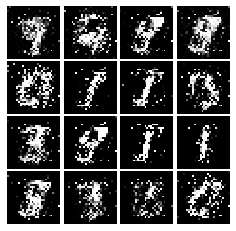

Epoch: 3, Iter: 1520, D: 0.1876, G:0.1796


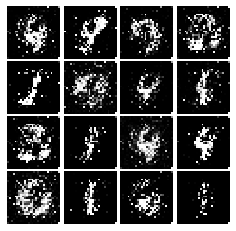

Epoch: 3, Iter: 1540, D: 0.2442, G:0.2621


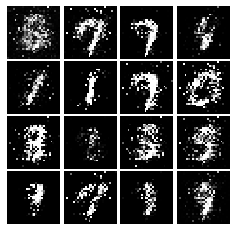

Epoch: 3, Iter: 1560, D: 0.1654, G:0.3652


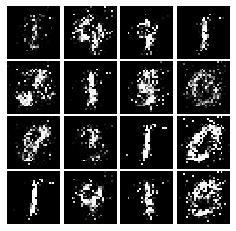

Epoch: 3, Iter: 1580, D: 0.1764, G:0.2264


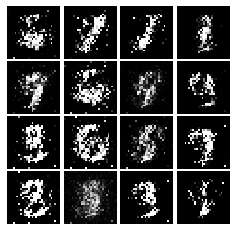

Epoch: 3, Iter: 1600, D: 0.1678, G:0.2495


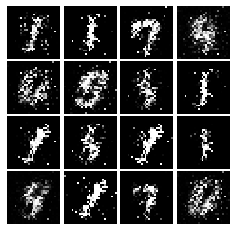

Epoch: 3, Iter: 1620, D: 0.1567, G:0.3598


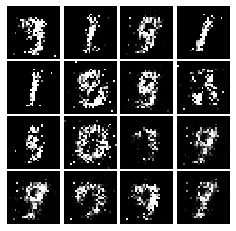

Epoch: 3, Iter: 1640, D: 0.2078, G:0.2388


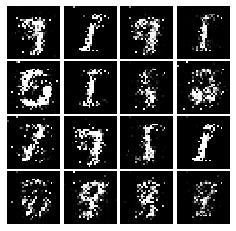

Epoch: 3, Iter: 1660, D: 0.1675, G:0.2546


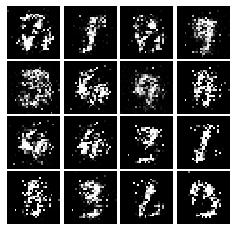

Epoch: 3, Iter: 1680, D: 0.1819, G:0.2784


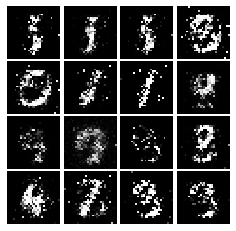

Epoch: 3, Iter: 1700, D: 0.2395, G:0.2388


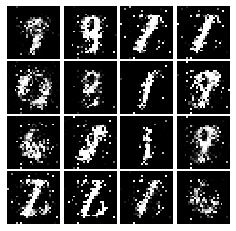

Epoch: 3, Iter: 1720, D: 0.2157, G:0.1711


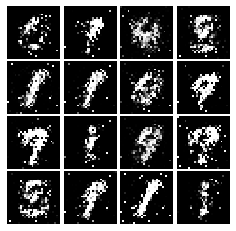

Epoch: 3, Iter: 1740, D: 0.2259, G:0.1839


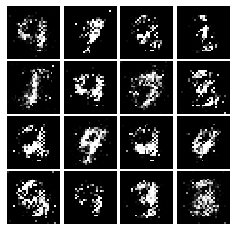

Epoch: 3, Iter: 1760, D: 0.1876, G:0.2367


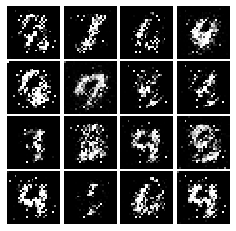

Epoch: 3, Iter: 1780, D: 0.1981, G:0.1838


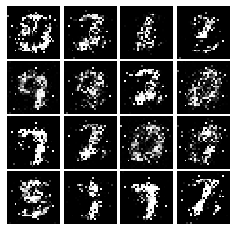

Epoch: 3, Iter: 1800, D: 0.1799, G:0.2303


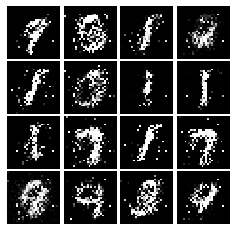

Epoch: 3, Iter: 1820, D: 0.1996, G:0.1842


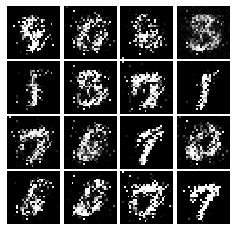

Epoch: 3, Iter: 1840, D: 0.1857, G:0.2197


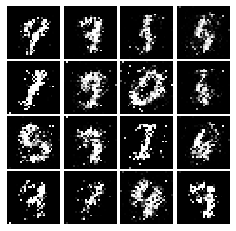

Epoch: 3, Iter: 1860, D: 0.1902, G:0.2373


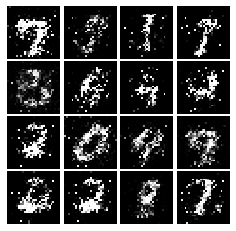

Epoch: 4, Iter: 1880, D: 0.1813, G:0.1786


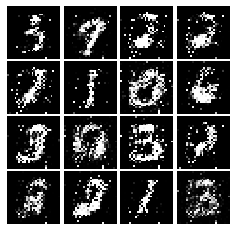

Epoch: 4, Iter: 1900, D: 0.2211, G:0.2449


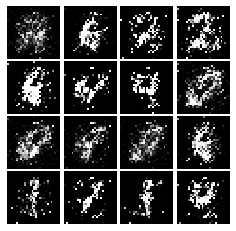

Epoch: 4, Iter: 1920, D: 0.2097, G:0.1962


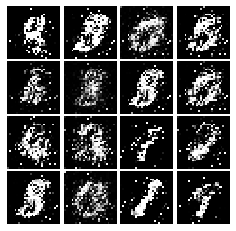

Epoch: 4, Iter: 1940, D: 0.1954, G:0.2449


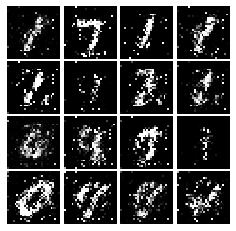

Epoch: 4, Iter: 1960, D: 0.2099, G:0.2366


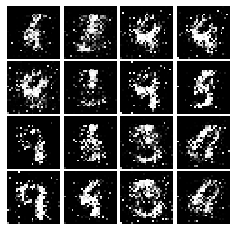

Epoch: 4, Iter: 1980, D: 0.2003, G:0.2117


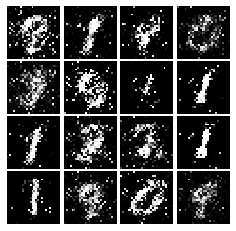

Epoch: 4, Iter: 2000, D: 0.2297, G:0.1945


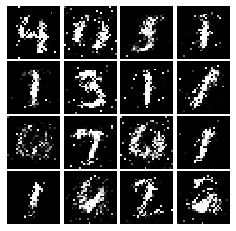

Epoch: 4, Iter: 2020, D: 0.2046, G:0.2144


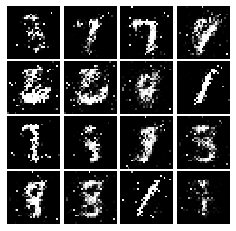

Epoch: 4, Iter: 2040, D: 0.216, G:0.3684


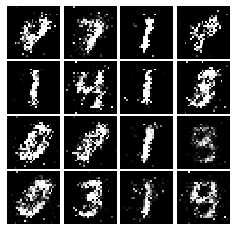

Epoch: 4, Iter: 2060, D: 0.2988, G:0.1547


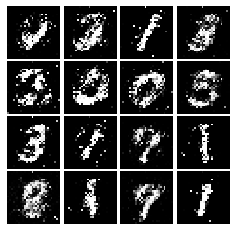

Epoch: 4, Iter: 2080, D: 0.2307, G:0.2103


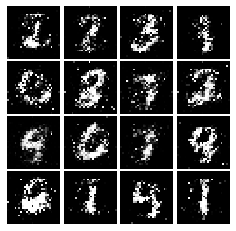

Epoch: 4, Iter: 2100, D: 0.2178, G:0.1626


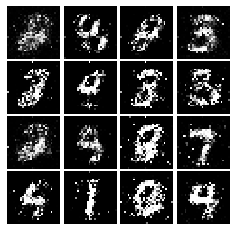

Epoch: 4, Iter: 2120, D: 0.2396, G:0.166


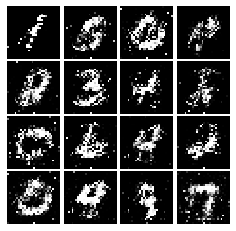

Epoch: 4, Iter: 2140, D: 0.1892, G:0.1913


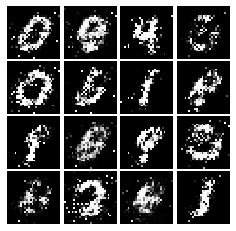

Epoch: 4, Iter: 2160, D: 0.2302, G:0.1889


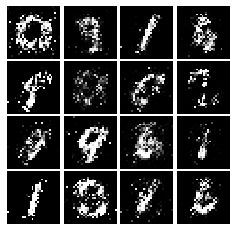

Epoch: 4, Iter: 2180, D: 0.2605, G:0.126


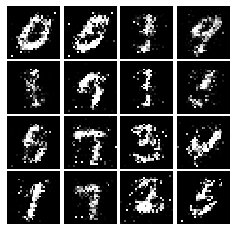

Epoch: 4, Iter: 2200, D: 0.2091, G:0.1962


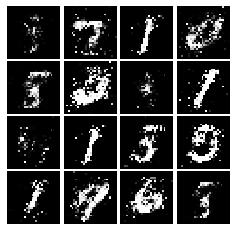

Epoch: 4, Iter: 2220, D: 0.212, G:0.2035


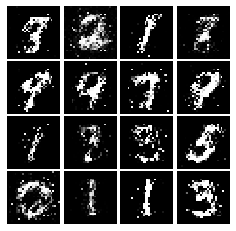

Epoch: 4, Iter: 2240, D: 0.2766, G:0.1657


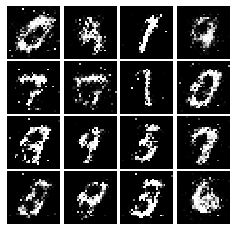

Epoch: 4, Iter: 2260, D: 0.1972, G:0.2263


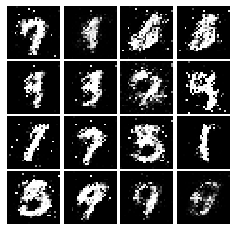

Epoch: 4, Iter: 2280, D: 0.2242, G:0.1801


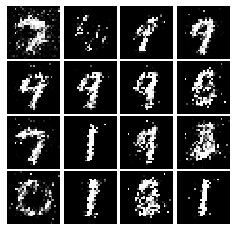

Epoch: 4, Iter: 2300, D: 0.2171, G:0.1792


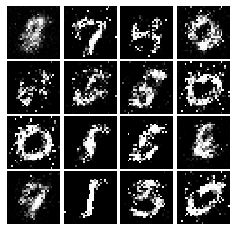

Epoch: 4, Iter: 2320, D: 0.2238, G:0.1912


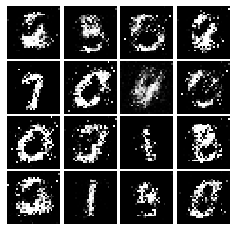

Epoch: 4, Iter: 2340, D: 0.2725, G:0.07509


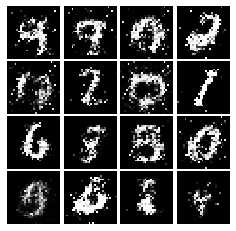

Epoch: 5, Iter: 2360, D: 0.2418, G:0.1964


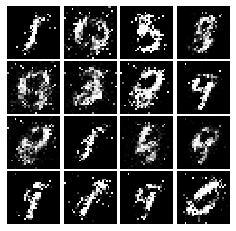

Epoch: 5, Iter: 2380, D: 0.2218, G:0.2235


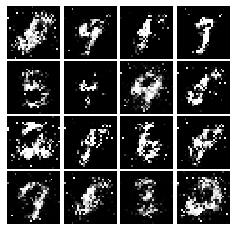

Epoch: 5, Iter: 2400, D: 0.208, G:0.1947


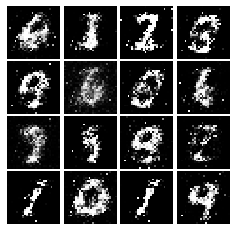

Epoch: 5, Iter: 2420, D: 0.2155, G:0.1899


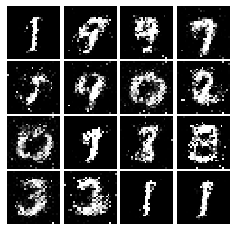

Epoch: 5, Iter: 2440, D: 0.2143, G:0.1691


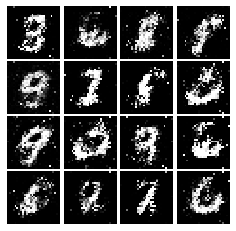

Epoch: 5, Iter: 2460, D: 0.1951, G:0.189


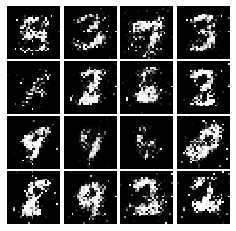

Epoch: 5, Iter: 2480, D: 0.2404, G:0.1632


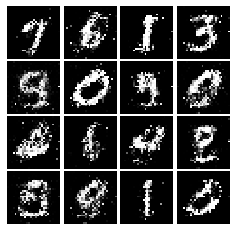

Epoch: 5, Iter: 2500, D: 0.2268, G:0.1917


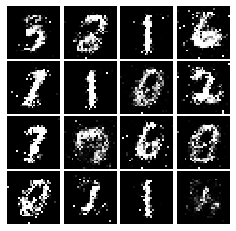

Epoch: 5, Iter: 2520, D: 0.2268, G:0.1724


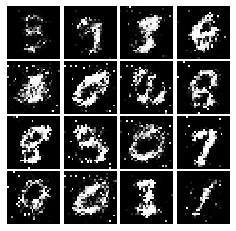

Epoch: 5, Iter: 2540, D: 0.2336, G:0.1681


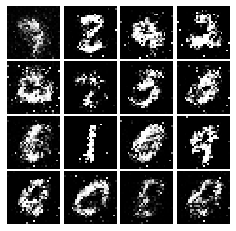

Epoch: 5, Iter: 2560, D: 0.2359, G:0.1557


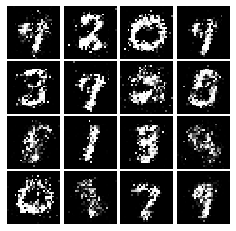

Epoch: 5, Iter: 2580, D: 0.238, G:0.201


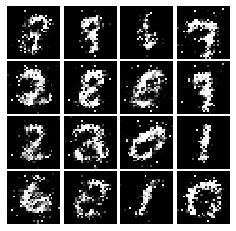

Epoch: 5, Iter: 2600, D: 0.2353, G:0.1654


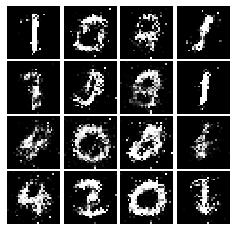

Epoch: 5, Iter: 2620, D: 0.2053, G:0.1756


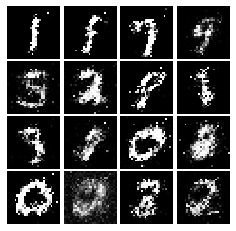

Epoch: 5, Iter: 2640, D: 0.239, G:0.1797


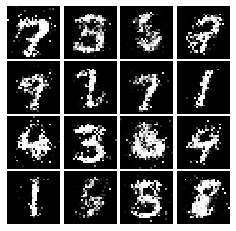

Epoch: 5, Iter: 2660, D: 0.2196, G:0.1752


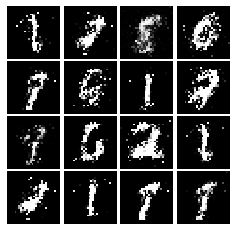

Epoch: 5, Iter: 2680, D: 0.2761, G:0.1738


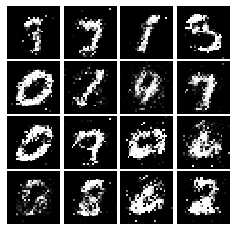

Epoch: 5, Iter: 2700, D: 0.2497, G:0.1571


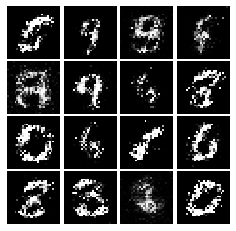

Epoch: 5, Iter: 2720, D: 0.2191, G:0.1829


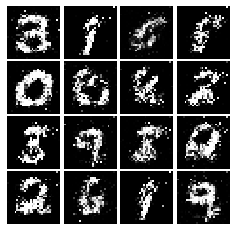

Epoch: 5, Iter: 2740, D: 0.2156, G:0.1607


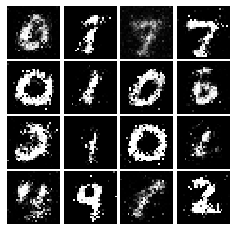

Epoch: 5, Iter: 2760, D: 0.2442, G:0.1676


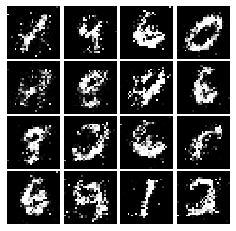

Epoch: 5, Iter: 2780, D: 0.2427, G:0.1558


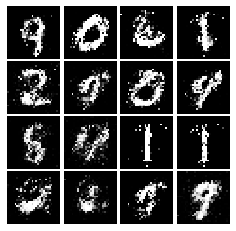

Epoch: 5, Iter: 2800, D: 0.2164, G:0.1856


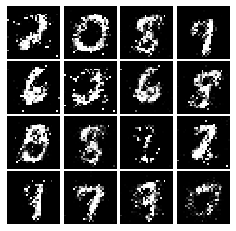

Epoch: 6, Iter: 2820, D: 0.2408, G:0.1797


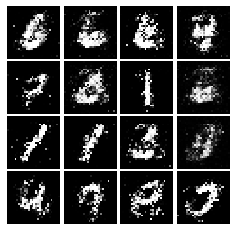

Epoch: 6, Iter: 2840, D: 0.2235, G:0.1635


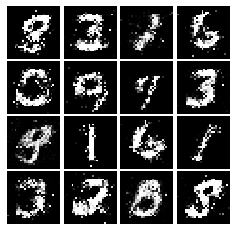

Epoch: 6, Iter: 2860, D: 0.225, G:0.1863


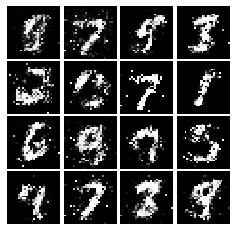

Epoch: 6, Iter: 2880, D: 0.2014, G:0.2382


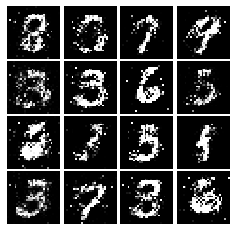

Epoch: 6, Iter: 2900, D: 0.222, G:0.2003


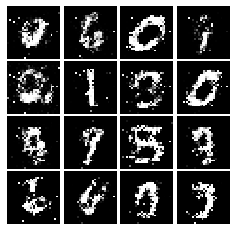

Epoch: 6, Iter: 2920, D: 0.2352, G:0.1689


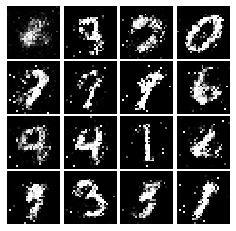

Epoch: 6, Iter: 2940, D: 0.2258, G:0.1732


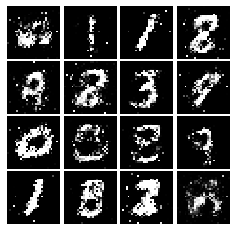

Epoch: 6, Iter: 2960, D: 0.2273, G:0.1766


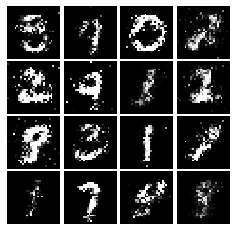

Epoch: 6, Iter: 2980, D: 0.2509, G:0.1556


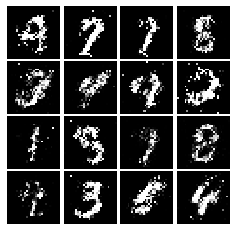

Epoch: 6, Iter: 3000, D: 0.2316, G:0.1562


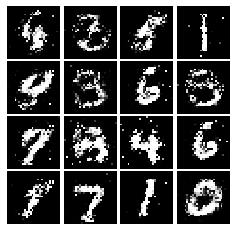

Epoch: 6, Iter: 3020, D: 0.2289, G:0.1578


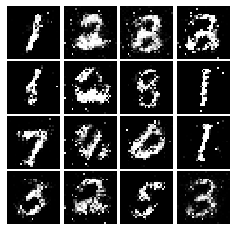

Epoch: 6, Iter: 3040, D: 0.235, G:0.1811


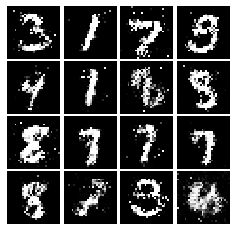

Epoch: 6, Iter: 3060, D: 0.239, G:0.1634


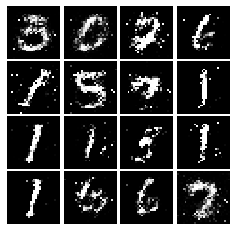

Epoch: 6, Iter: 3080, D: 0.2402, G:0.1417


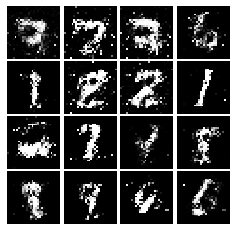

Epoch: 6, Iter: 3100, D: 0.2303, G:0.1518


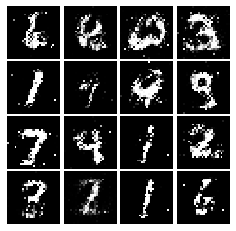

Epoch: 6, Iter: 3120, D: 0.23, G:0.1627


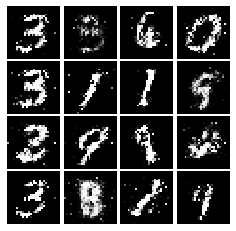

Epoch: 6, Iter: 3140, D: 0.2472, G:0.1788


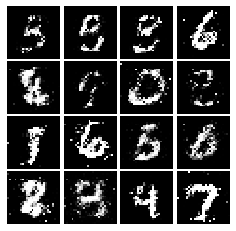

Epoch: 6, Iter: 3160, D: 0.222, G:0.1975


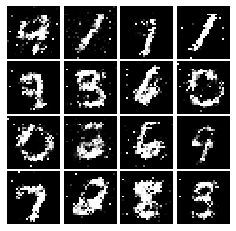

Epoch: 6, Iter: 3180, D: 0.2349, G:0.2037


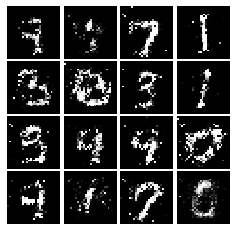

Epoch: 6, Iter: 3200, D: 0.2207, G:0.1797


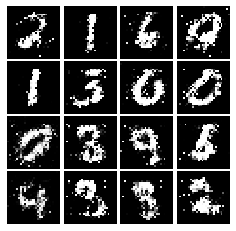

Epoch: 6, Iter: 3220, D: 0.2351, G:0.1627


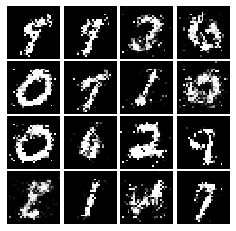

Epoch: 6, Iter: 3240, D: 0.2334, G:0.1858


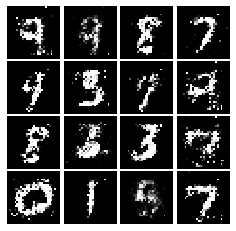

Epoch: 6, Iter: 3260, D: 0.2308, G:0.1497


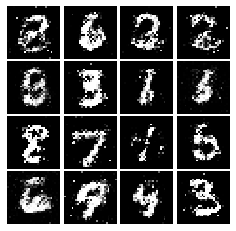

Epoch: 6, Iter: 3280, D: 0.2426, G:0.1776


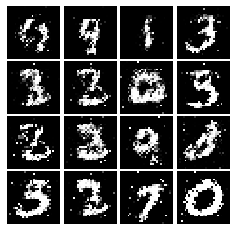

Epoch: 7, Iter: 3300, D: 0.2281, G:0.1714


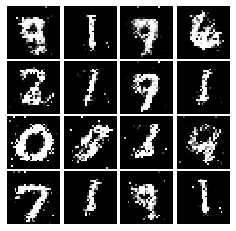

Epoch: 7, Iter: 3320, D: 0.2207, G:0.1817


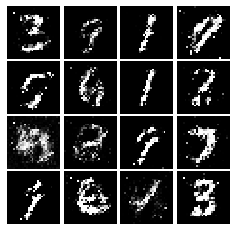

Epoch: 7, Iter: 3340, D: 0.221, G:0.1866


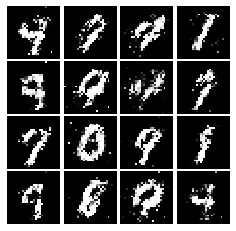

Epoch: 7, Iter: 3360, D: 0.2509, G:0.171


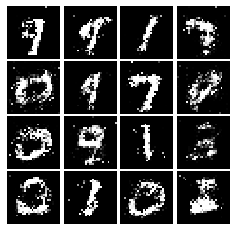

Epoch: 7, Iter: 3380, D: 0.2192, G:0.1559


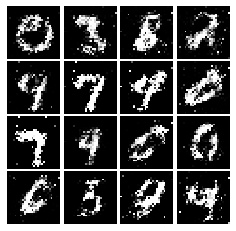

Epoch: 7, Iter: 3400, D: 0.2441, G:0.17


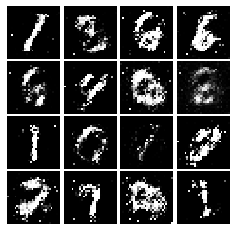

Epoch: 7, Iter: 3420, D: 0.2293, G:0.1854


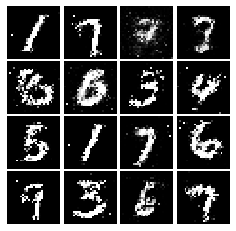

Epoch: 7, Iter: 3440, D: 0.2458, G:0.1851


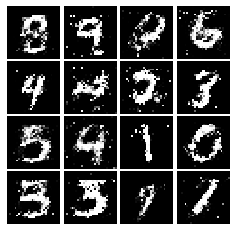

Epoch: 7, Iter: 3460, D: 0.2184, G:0.2047


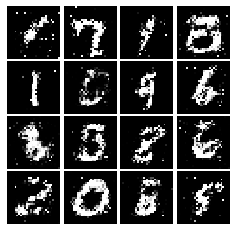

Epoch: 7, Iter: 3480, D: 0.2275, G:0.1804


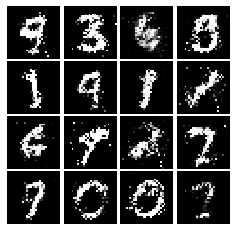

Epoch: 7, Iter: 3500, D: 0.2486, G:0.1431


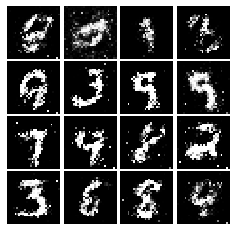

Epoch: 7, Iter: 3520, D: 0.2335, G:0.1535


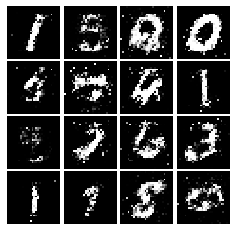

Epoch: 7, Iter: 3540, D: 0.2165, G:0.188


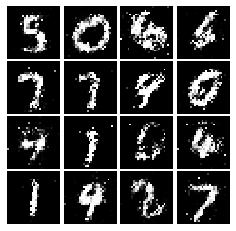

Epoch: 7, Iter: 3560, D: 0.2287, G:0.1741


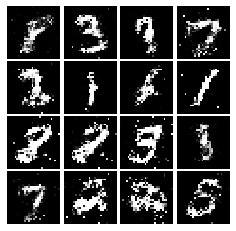

Epoch: 7, Iter: 3580, D: 0.2138, G:0.1748


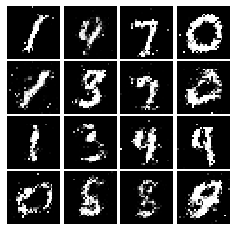

Epoch: 7, Iter: 3600, D: 0.2275, G:0.1585


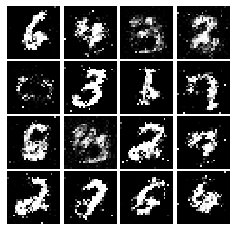

Epoch: 7, Iter: 3620, D: 0.2383, G:0.1595


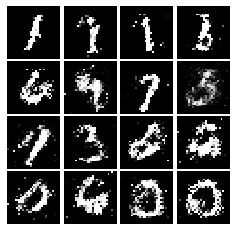

Epoch: 7, Iter: 3640, D: 0.2393, G:0.1745


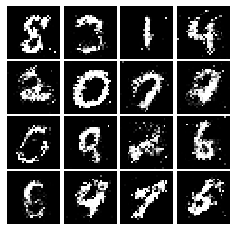

Epoch: 7, Iter: 3660, D: 0.242, G:0.1871


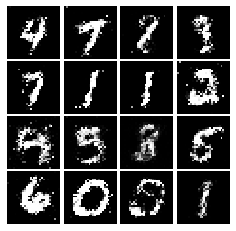

Epoch: 7, Iter: 3680, D: 0.2387, G:0.1823


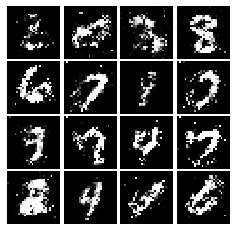

Epoch: 7, Iter: 3700, D: 0.2257, G:0.1545


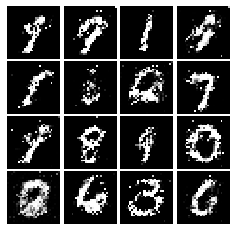

Epoch: 7, Iter: 3720, D: 0.2222, G:0.1504


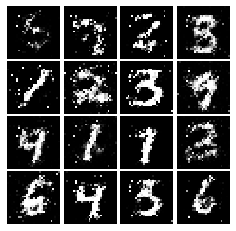

Epoch: 7, Iter: 3740, D: 0.2368, G:0.1768


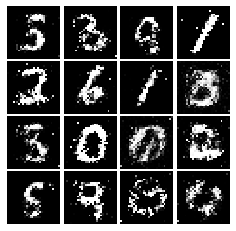

Epoch: 8, Iter: 3760, D: 0.2264, G:0.1598


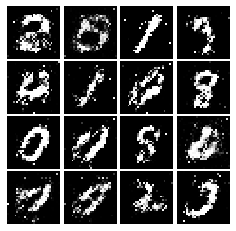

Epoch: 8, Iter: 3780, D: 0.2076, G:0.1601


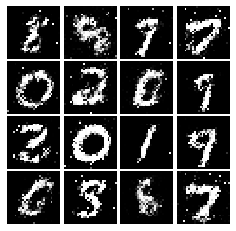

Epoch: 8, Iter: 3800, D: 0.2034, G:0.1857


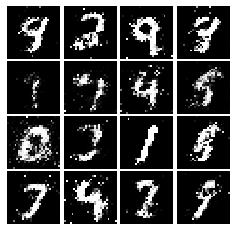

Epoch: 8, Iter: 3820, D: 0.2317, G:0.1745


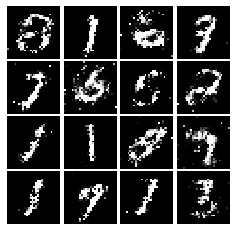

Epoch: 8, Iter: 3840, D: 0.2324, G:0.1654


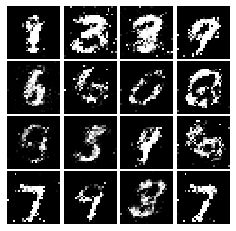

Epoch: 8, Iter: 3860, D: 0.2276, G:0.179


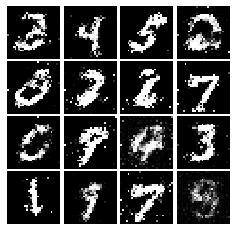

Epoch: 8, Iter: 3880, D: 0.2143, G:0.1659


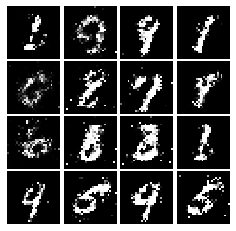

Epoch: 8, Iter: 3900, D: 0.238, G:0.1743


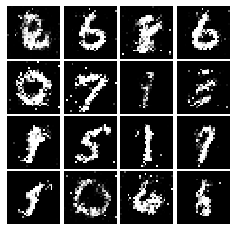

Epoch: 8, Iter: 3920, D: 0.2217, G:0.1643


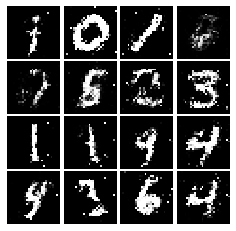

Epoch: 8, Iter: 3940, D: 0.2317, G:0.1422


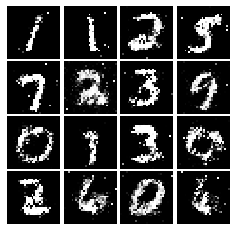

Epoch: 8, Iter: 3960, D: 0.2263, G:0.1613


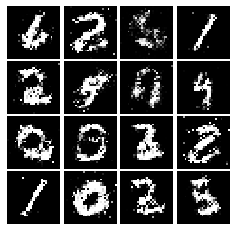

Epoch: 8, Iter: 3980, D: 0.2385, G:0.1565


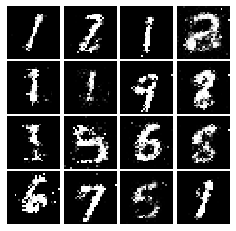

Epoch: 8, Iter: 4000, D: 0.2608, G:0.192


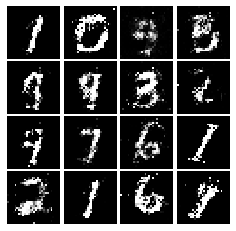

Epoch: 8, Iter: 4020, D: 0.2156, G:0.1608


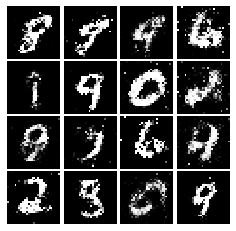

Epoch: 8, Iter: 4040, D: 0.2333, G:0.1626


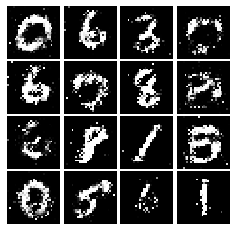

Epoch: 8, Iter: 4060, D: 0.2422, G:0.1622


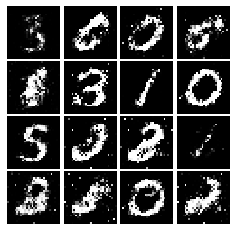

Epoch: 8, Iter: 4080, D: 0.2517, G:0.1638


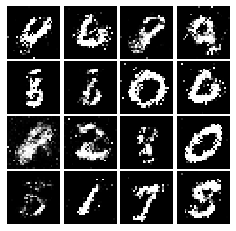

Epoch: 8, Iter: 4100, D: 0.2414, G:0.179


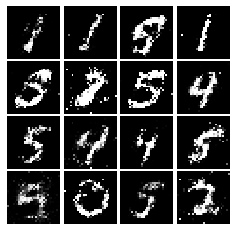

Epoch: 8, Iter: 4120, D: 0.2312, G:0.1699


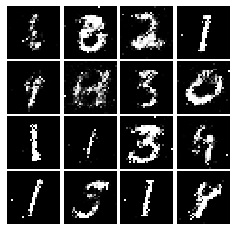

Epoch: 8, Iter: 4140, D: 0.2407, G:0.1699


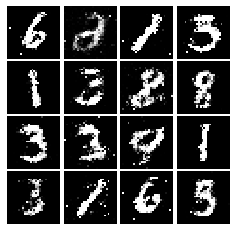

Epoch: 8, Iter: 4160, D: 0.2322, G:0.1434


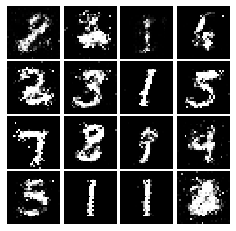

Epoch: 8, Iter: 4180, D: 0.2534, G:0.1681


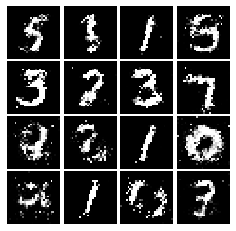

Epoch: 8, Iter: 4200, D: 0.2278, G:0.1496


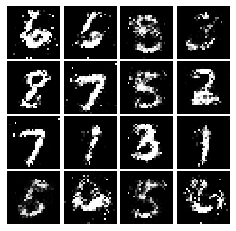

Epoch: 8, Iter: 4220, D: 0.2237, G:0.2133


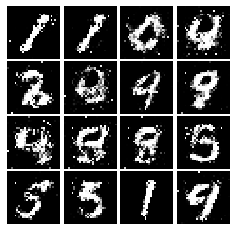

Epoch: 9, Iter: 4240, D: 0.2482, G:0.1398


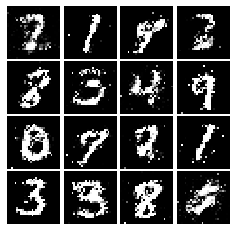

Epoch: 9, Iter: 4260, D: 0.2302, G:0.1813


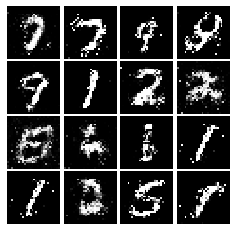

Epoch: 9, Iter: 4280, D: 0.233, G:0.2138


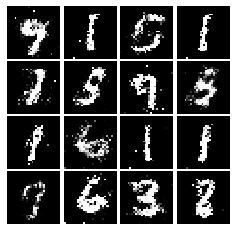

Epoch: 9, Iter: 4300, D: 0.2506, G:0.1728


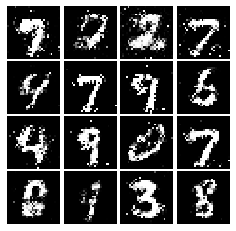

Epoch: 9, Iter: 4320, D: 0.2323, G:0.1702


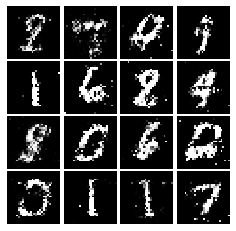

Epoch: 9, Iter: 4340, D: 0.2424, G:0.161


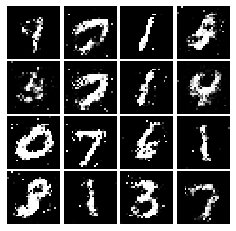

Epoch: 9, Iter: 4360, D: 0.232, G:0.184


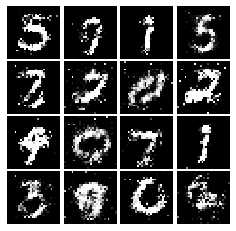

Epoch: 9, Iter: 4380, D: 0.2496, G:0.1685


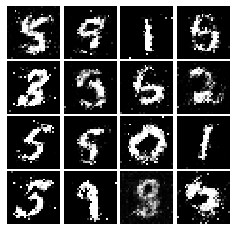

Epoch: 9, Iter: 4400, D: 0.219, G:0.1829


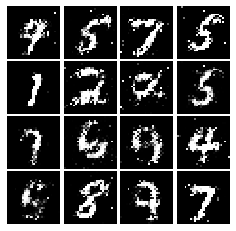

Epoch: 9, Iter: 4420, D: 0.2239, G:0.18


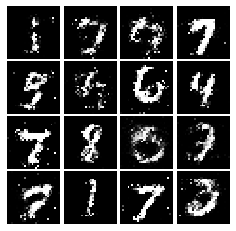

Epoch: 9, Iter: 4440, D: 0.2559, G:0.1655


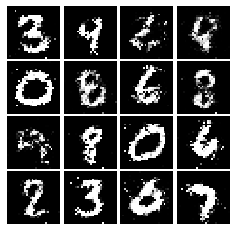

Epoch: 9, Iter: 4460, D: 0.228, G:0.1672


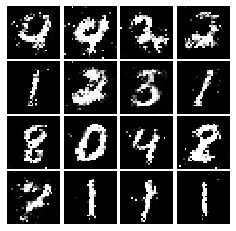

Epoch: 9, Iter: 4480, D: 0.2072, G:0.1834


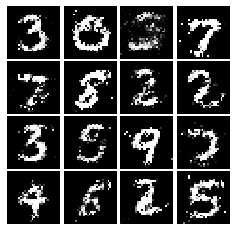

Epoch: 9, Iter: 4500, D: 0.2793, G:0.1711


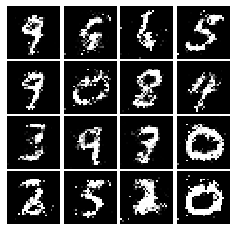

Epoch: 9, Iter: 4520, D: 0.2176, G:0.1665


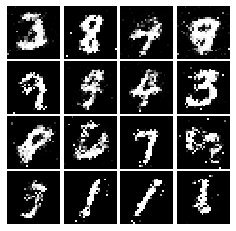

Epoch: 9, Iter: 4540, D: 0.247, G:0.1329


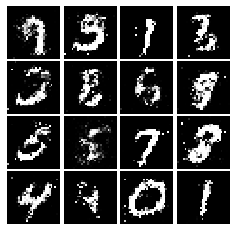

Epoch: 9, Iter: 4560, D: 0.2265, G:0.1505


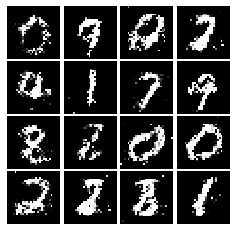

Epoch: 9, Iter: 4580, D: 0.2374, G:0.1581


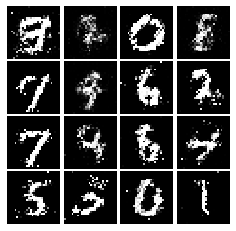

Epoch: 9, Iter: 4600, D: 0.2496, G:0.165


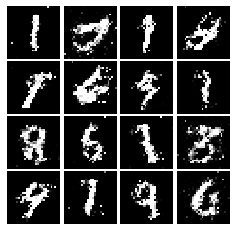

Epoch: 9, Iter: 4620, D: 0.2396, G:0.1554


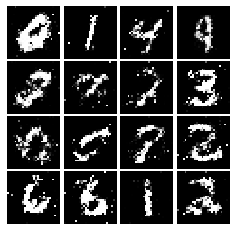

Epoch: 9, Iter: 4640, D: 0.2405, G:0.1798


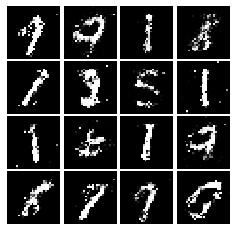

Epoch: 9, Iter: 4660, D: 0.2616, G:0.1676


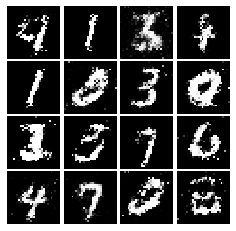

Epoch: 9, Iter: 4680, D: 0.2249, G:0.15


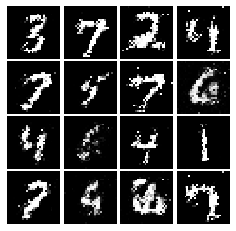

Final images


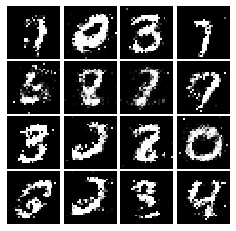

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [26]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28, 28, 1), input_shape = ()),
        tf.keras.layers.Conv2D(32, (5, 5), strides=1, padding='valid', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(2, 2),
        tf.keras.layers.Conv2D(64, (5, 5), strides=1, padding='valid', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(2, 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64, activation=leaky_relu),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [35]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    tf.keras.layers.Dense(1024, activation=tf.nn.relu, input_shape=(noise_dim,)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128, activation=tf.nn.relu),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7, 7, 128)),
    tf.keras.layers.Conv2DTranspose(64, 4, 2,padding='same', activation=tf.nn.relu),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, 4, 2, padding='same', activation=tf.nn.tanh)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.445, G:0.6554


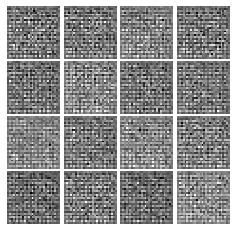

Epoch: 0, Iter: 20, D: 0.1884, G:2.155


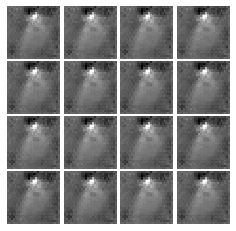

Epoch: 0, Iter: 40, D: 0.09019, G:15.46


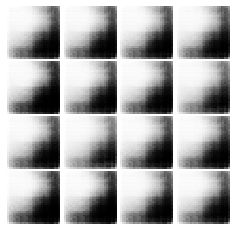

Epoch: 0, Iter: 60, D: 6.737, G:6.749


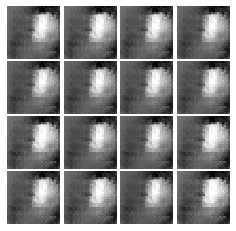

Epoch: 0, Iter: 80, D: 0.1153, G:2.837


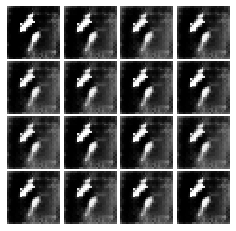

Epoch: 0, Iter: 100, D: 0.4602, G:2.661


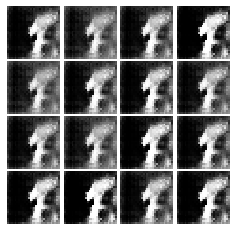

Epoch: 0, Iter: 120, D: 0.403, G:6.596


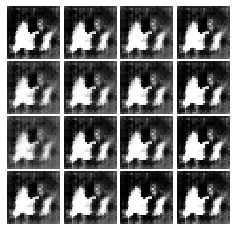

Epoch: 0, Iter: 140, D: 0.5425, G:1.757


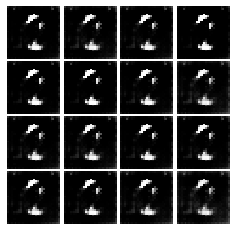

Epoch: 0, Iter: 160, D: 0.07177, G:4.141


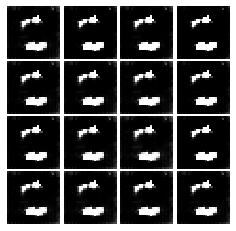

Epoch: 0, Iter: 180, D: 4.044, G:12.82


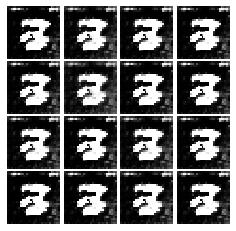

Epoch: 0, Iter: 200, D: 0.6274, G:2.192


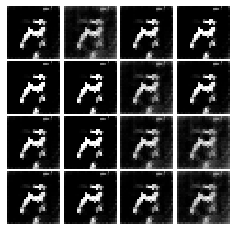

Epoch: 0, Iter: 220, D: 1.983, G:1.124


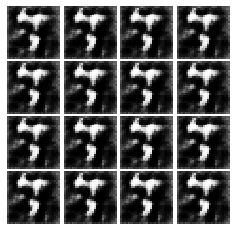

Epoch: 0, Iter: 240, D: 0.539, G:3.539


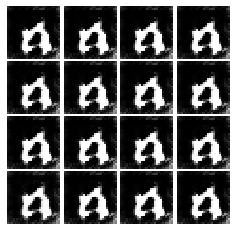

Epoch: 0, Iter: 260, D: 0.1018, G:3.478


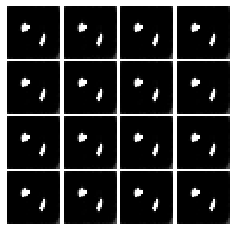

Epoch: 0, Iter: 280, D: 2.646, G:11.67


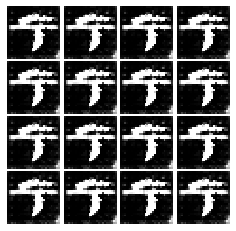

Epoch: 0, Iter: 300, D: 0.5098, G:3.004


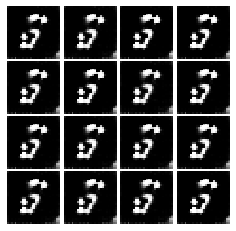

Epoch: 0, Iter: 320, D: 0.5841, G:2.517


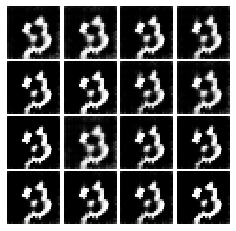

Epoch: 0, Iter: 340, D: 0.9691, G:2.303


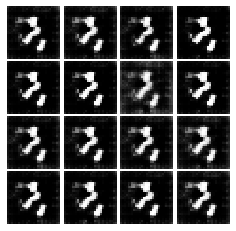

Epoch: 0, Iter: 360, D: 0.3927, G:3.035


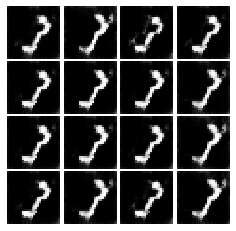

Epoch: 0, Iter: 380, D: 0.5064, G:2.175


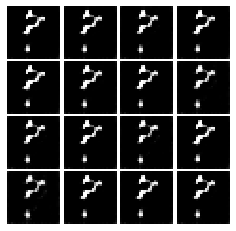

Epoch: 0, Iter: 400, D: 0.4439, G:7.385


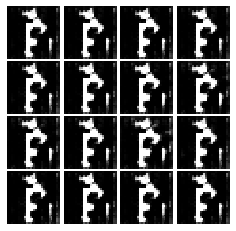

Epoch: 0, Iter: 420, D: 0.5769, G:2.517


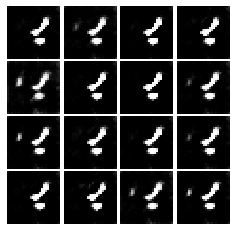

Epoch: 0, Iter: 440, D: 0.1802, G:3.897


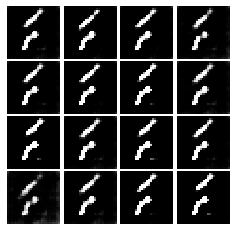

Epoch: 0, Iter: 460, D: 1.173, G:4.426


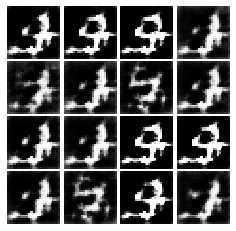

Epoch: 1, Iter: 480, D: 0.5273, G:3.625


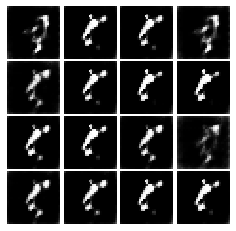

Epoch: 1, Iter: 500, D: 0.5015, G:2.16


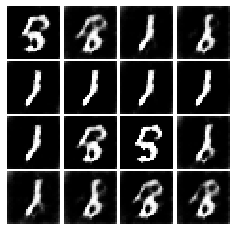

Epoch: 1, Iter: 520, D: 1.169, G:3.472


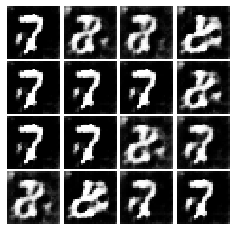

Epoch: 1, Iter: 540, D: 0.3789, G:2.487


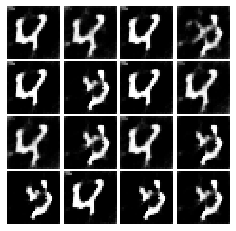

Epoch: 1, Iter: 560, D: 1.258, G:2.546


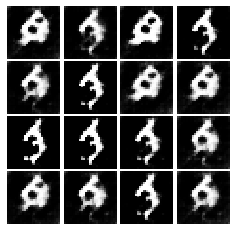

Epoch: 1, Iter: 580, D: 0.2901, G:3.898


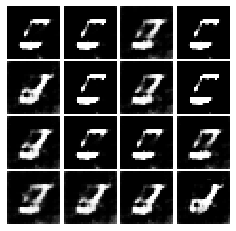

Epoch: 1, Iter: 600, D: 0.9857, G:1.299


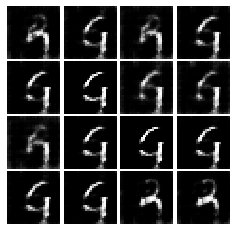

Epoch: 1, Iter: 620, D: 0.9846, G:1.516


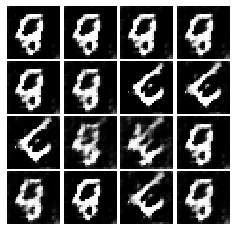

Epoch: 1, Iter: 640, D: 0.3268, G:5.763


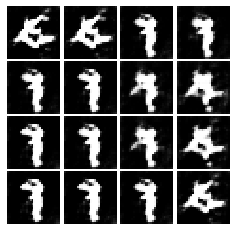

Epoch: 1, Iter: 660, D: 0.665, G:2.321


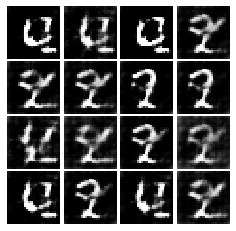

Epoch: 1, Iter: 680, D: 0.4328, G:2.634


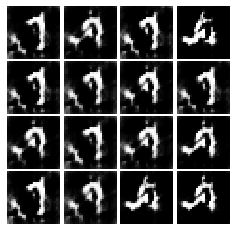

Epoch: 1, Iter: 700, D: 0.3218, G:5.111


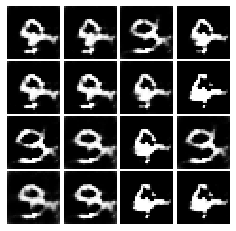

Epoch: 1, Iter: 720, D: 1.362, G:4.122


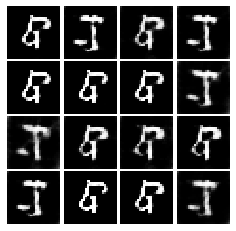

Epoch: 1, Iter: 740, D: 0.684, G:3.62


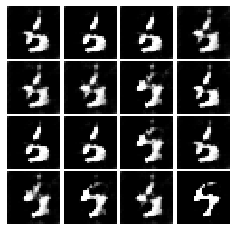

Epoch: 1, Iter: 760, D: 1.613, G:2.305


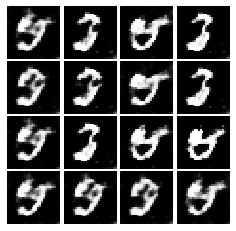

Epoch: 1, Iter: 780, D: 0.4978, G:3.818


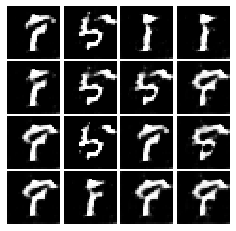

Epoch: 1, Iter: 800, D: 0.5984, G:3.119


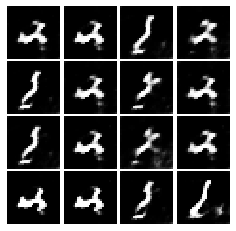

Epoch: 1, Iter: 820, D: 0.4094, G:3.928


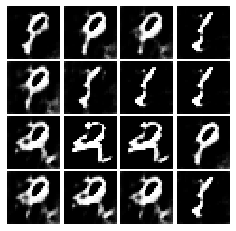

Epoch: 1, Iter: 840, D: 2.8, G:2.992


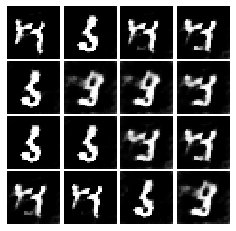

Epoch: 1, Iter: 860, D: 0.346, G:3.995


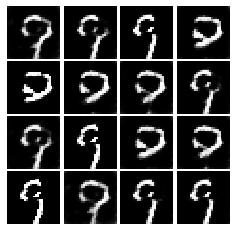

Epoch: 1, Iter: 880, D: 2.118, G:3.49


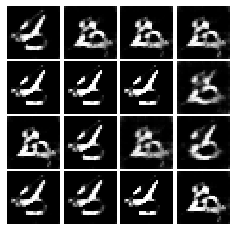

Epoch: 1, Iter: 900, D: 0.4689, G:3.109


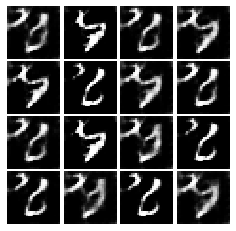

Epoch: 1, Iter: 920, D: 0.3475, G:3.646


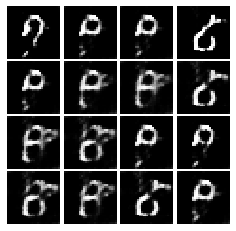

Epoch: 2, Iter: 940, D: 0.4451, G:2.414


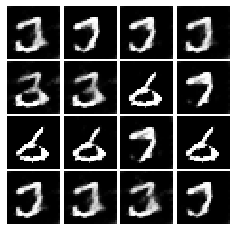

Epoch: 2, Iter: 960, D: 0.3788, G:3.445


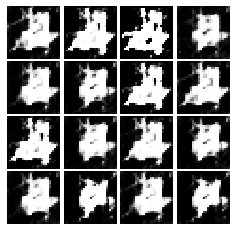

Epoch: 2, Iter: 980, D: 0.2492, G:3.897


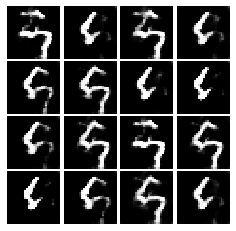

Epoch: 2, Iter: 1000, D: 0.444, G:3.94


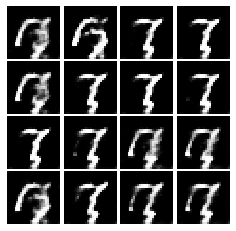

Epoch: 2, Iter: 1020, D: 0.3427, G:3.416


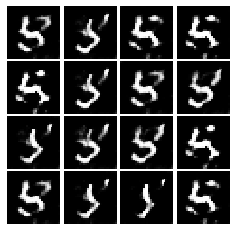

Epoch: 2, Iter: 1040, D: 1.041, G:5.478


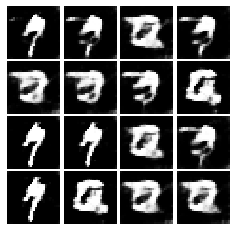

Epoch: 2, Iter: 1060, D: 0.3066, G:3.704


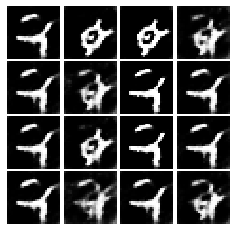

Epoch: 2, Iter: 1080, D: 0.484, G:1.643


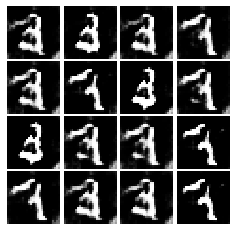

Epoch: 2, Iter: 1100, D: 0.2357, G:3.944


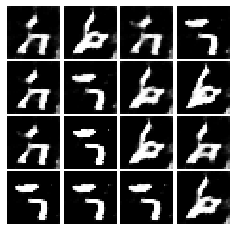

Epoch: 2, Iter: 1120, D: 1.165, G:6.599


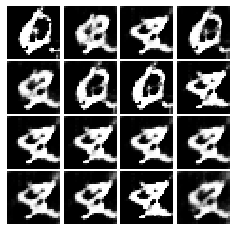

Epoch: 2, Iter: 1140, D: 0.2584, G:4.032


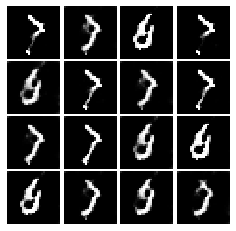

Epoch: 2, Iter: 1160, D: 0.2866, G:4.886


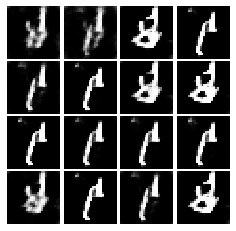

Epoch: 2, Iter: 1180, D: 0.2379, G:3.234


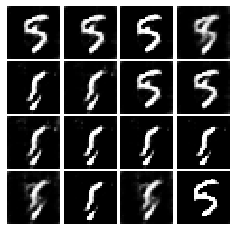

Epoch: 2, Iter: 1200, D: 0.2413, G:3.915


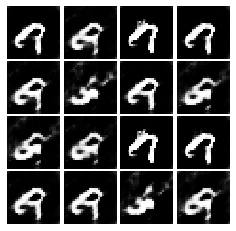

Epoch: 2, Iter: 1220, D: 0.4467, G:4.854


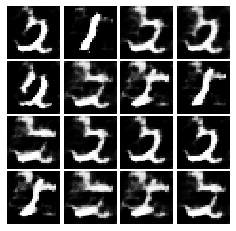

Epoch: 2, Iter: 1240, D: 0.3654, G:3.542


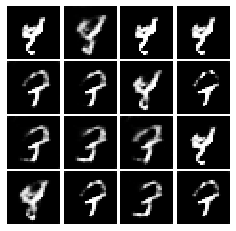

Epoch: 2, Iter: 1260, D: 0.3525, G:3.125


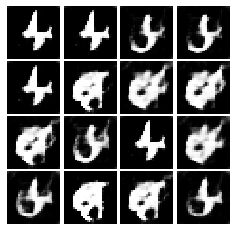

Epoch: 2, Iter: 1280, D: 0.4942, G:4.086


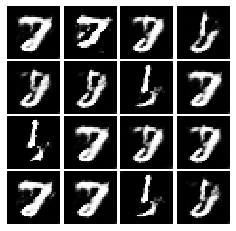

Epoch: 2, Iter: 1300, D: 0.6177, G:5.091


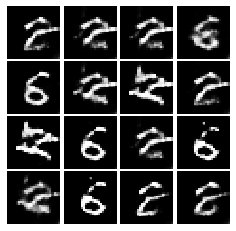

Epoch: 2, Iter: 1320, D: 0.5519, G:3.549


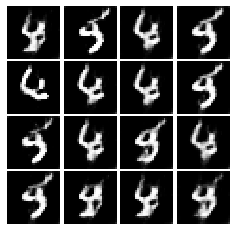

Epoch: 2, Iter: 1340, D: 0.5583, G:2.537


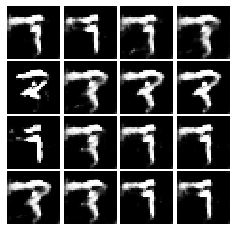

Epoch: 2, Iter: 1360, D: 0.3672, G:3.409


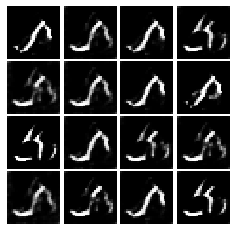

Epoch: 2, Iter: 1380, D: 0.2749, G:3.376


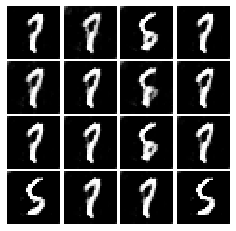

Epoch: 2, Iter: 1400, D: 0.4507, G:4.225


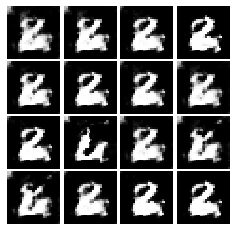

Epoch: 3, Iter: 1420, D: 0.8785, G:4.547


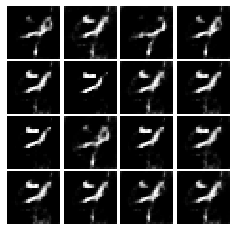

Epoch: 3, Iter: 1440, D: 0.08175, G:5.448


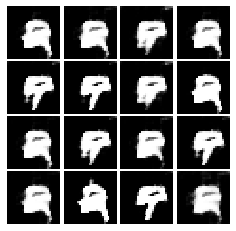

Epoch: 3, Iter: 1460, D: 1.06, G:4.341


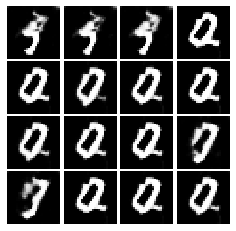

Epoch: 3, Iter: 1480, D: 0.2485, G:4.023


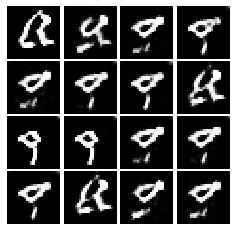

Epoch: 3, Iter: 1500, D: 0.4348, G:3.471


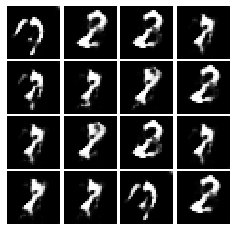

Epoch: 3, Iter: 1520, D: 0.5864, G:2.883


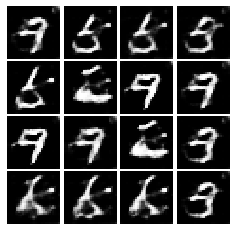

Epoch: 3, Iter: 1540, D: 0.6832, G:5.516


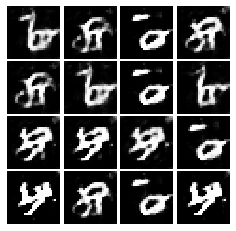

Epoch: 3, Iter: 1560, D: 0.2973, G:3.708


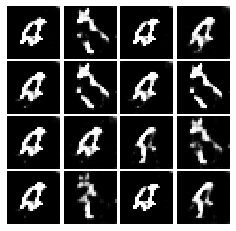

Epoch: 3, Iter: 1580, D: 0.4042, G:1.869


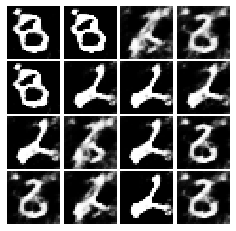

Epoch: 3, Iter: 1600, D: 0.8729, G:6.825


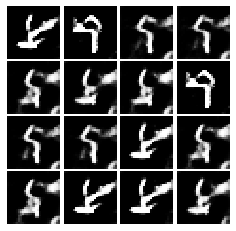

Epoch: 3, Iter: 1620, D: 0.1364, G:3.414


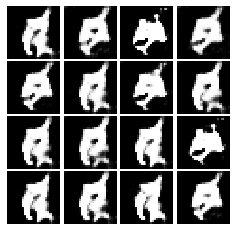

Epoch: 3, Iter: 1640, D: 0.7036, G:6.578


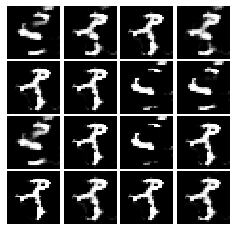

Epoch: 3, Iter: 1660, D: 0.452, G:4.843


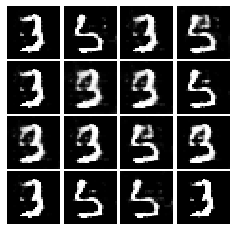

Epoch: 3, Iter: 1680, D: 0.3145, G:4.749


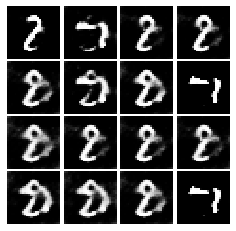

Epoch: 3, Iter: 1700, D: 0.5024, G:2.99


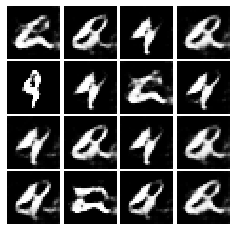

Epoch: 3, Iter: 1720, D: 0.366, G:3.485


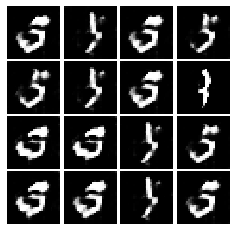

Epoch: 3, Iter: 1740, D: 0.2594, G:2.932


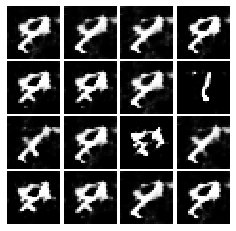

Epoch: 3, Iter: 1760, D: 1.137, G:4.848


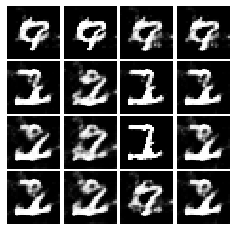

Epoch: 3, Iter: 1780, D: 0.2048, G:3.532


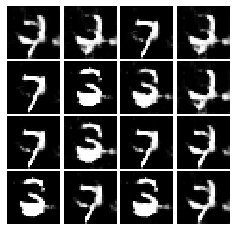

Epoch: 3, Iter: 1800, D: 0.3195, G:3.362


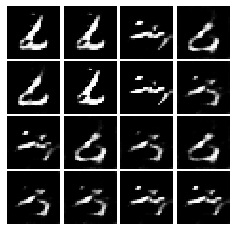

Epoch: 3, Iter: 1820, D: 0.23, G:3.166


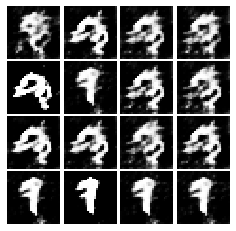

Epoch: 3, Iter: 1840, D: 0.5504, G:2.517


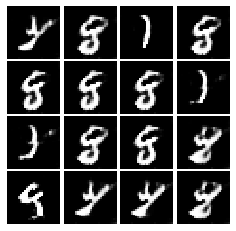

Epoch: 3, Iter: 1860, D: 0.4318, G:2.639


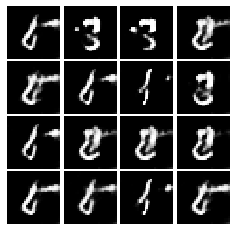

Epoch: 4, Iter: 1880, D: 0.3176, G:2.634


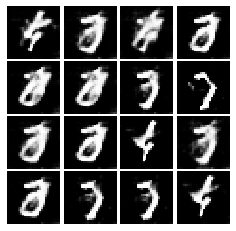

Epoch: 4, Iter: 1900, D: 0.6837, G:2.487


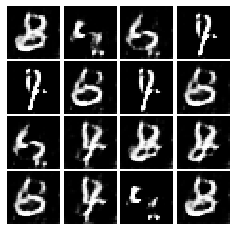

Epoch: 4, Iter: 1920, D: 0.2691, G:3.348


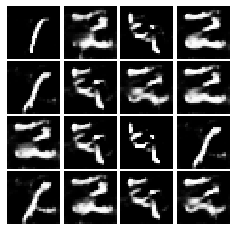

Epoch: 4, Iter: 1940, D: 0.3008, G:2.138


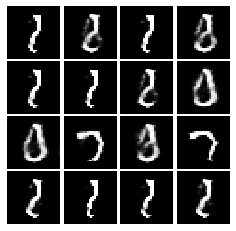

Epoch: 4, Iter: 1960, D: 0.56, G:3.489


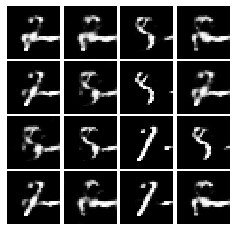

Epoch: 4, Iter: 1980, D: 0.1571, G:3.414


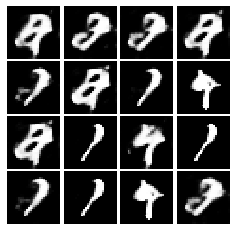

Epoch: 4, Iter: 2000, D: 0.6734, G:2.186


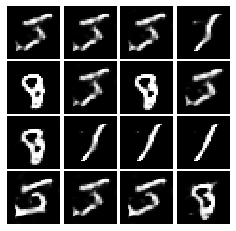

Epoch: 4, Iter: 2020, D: 0.4357, G:3.933


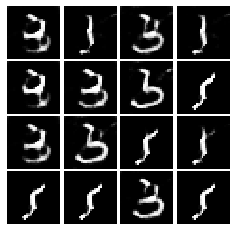

Epoch: 4, Iter: 2040, D: 0.3618, G:2.917


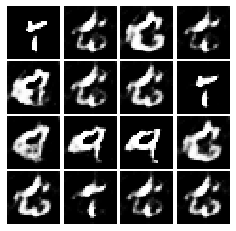

Epoch: 4, Iter: 2060, D: 0.2962, G:4.547


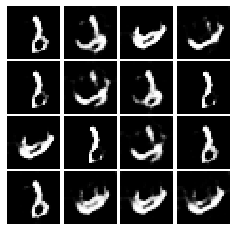

Epoch: 4, Iter: 2080, D: 0.2961, G:3.971


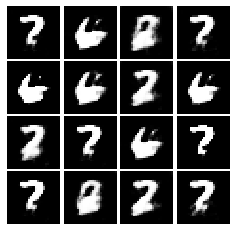

Epoch: 4, Iter: 2100, D: 0.1156, G:4.156


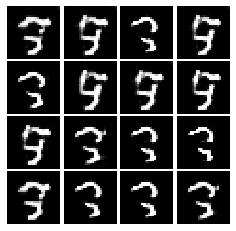

Epoch: 4, Iter: 2120, D: 0.08743, G:4.683


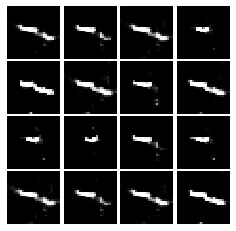

Epoch: 4, Iter: 2140, D: 0.4208, G:9.375


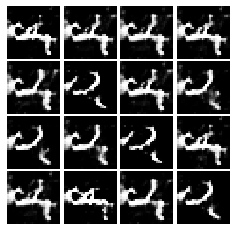

Epoch: 4, Iter: 2160, D: 0.3761, G:4.459


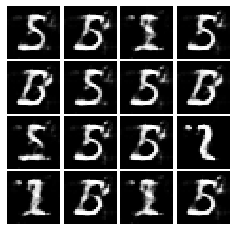

Epoch: 4, Iter: 2180, D: 0.702, G:6.11


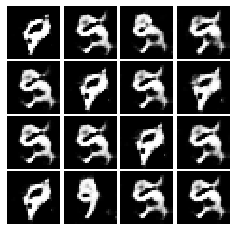

Epoch: 4, Iter: 2200, D: 0.2183, G:4.145


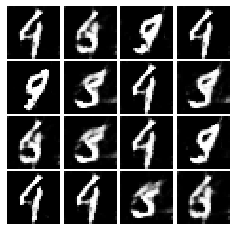

Epoch: 4, Iter: 2220, D: 0.1409, G:4.172


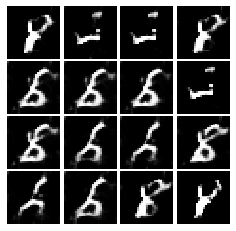

Epoch: 4, Iter: 2240, D: 0.1911, G:4.381


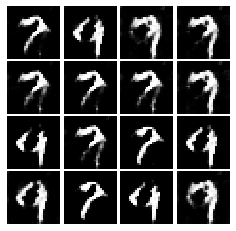

Epoch: 4, Iter: 2260, D: 0.2804, G:4.411


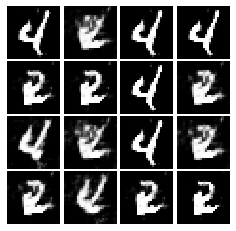

Epoch: 4, Iter: 2280, D: 0.3332, G:4.769


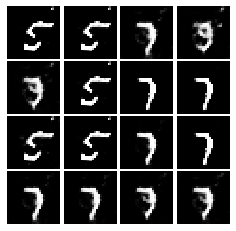

Epoch: 4, Iter: 2300, D: 0.3919, G:5.766


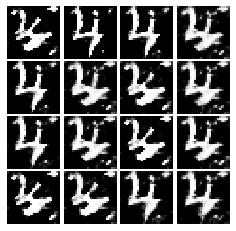

Epoch: 4, Iter: 2320, D: 0.1547, G:4.231


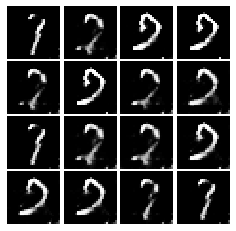

Epoch: 4, Iter: 2340, D: 0.2644, G:3.967


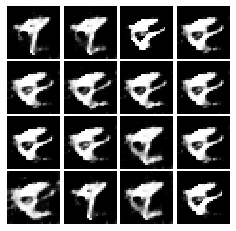

Final images


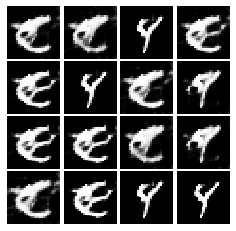

In [36]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
